# Assignment

## 1. Motivation
A world which has cought the imagination of most children growing up in this current and last century, and certainly all of our group members is Middle-earth, created by J.R.R. Tolkien. The most notable recent appearences of it and the one which we are going to analyze in this assignment is it's portrayal in the recent film trilogy directer by Peter Jackson, as well as examinining the fan created [One Wiki to Rule Them All](http://lotr.wikia.com/wiki/Main_Page), and the three novels originally published in 1954 and 1955.

Due to our focus only being on the Lord of the Rings, and not on other works of J.R.R. Tolkien, we only downloaded the data of characters present in that certain trilogy. Mentioned residents of Middle-earth on the website are 988, but only 152 of them are present in Lord of the Rings. We also found the novels on [archive.org](https://archive.org/) and the movie transcripts.

The final goal of this experiment is to understand the movie (the trilogy) and books better, also to see the differences among them. To see how the character related to each other, see the importance of the characters from both the movies and then book. Understand the sentiment of each book and character and see the evolution of the sentiment trhough out.


## 2. Basic stats, Data importing and cleaning. 


Total size of required datasets was 4.5 MB.
- Two .csv files containing the name of the characters 153 characters in a single column. Total size: 3.7 kB.
- Three .txt files containing the contents of the novels. Amounting to a total of 483,660 words and 2,044,075 characters (without spaces). Total size: 2.5 MB.
- One .csv file containing the names of characters and their respective lines in the movie and which movie it is mentioned in. A total of 2395 rows and 4 columns. Total size: 229.3 kb.
- One .txt file containing a sentimental score of 10222 words. Total size: 405.7 kB.
- 153 .txt files were created throughout the assignment with all the information from the wikipages for the characters in the movies. Total size: 2.36 Mb

Here below are some general modules and functions which will be used to gather the data and analyze it throughout the notebook.

In [1]:
# -*- coding: utf-8 -*-
% matplotlib inline
import re, math, string, nltk, random, io, xml, os, wordcloud, urllib2, json, warnings, collections
import numpy as np
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
import pandas as pd
from scipy import sparse
import matplotlib.pyplot as plt
# What is this? from matplotlib import cm
from scipy.misc import imread
from wordcloud import WordCloud, ImageColorGenerator
from collections import defaultdict, Counter
import networkx as nx
from __future__ import division
import community as community
from PIL import Image
from fa2 import ForceAtlas2
#from IPython.display import clear_output



### 2.1.a Data importing and cleaning: The wikipages

From the fan created [Lord of the Rings wikia](http://lotr.wikia.com/wiki/Main_Page), where information about all sorts of creatures from Middle Earth can be found. We gathered the names of all characters listed [here](http://lotr.wikia.com/wiki/Category:The_Lord_of_the_Rings_Characters) into a CSV file. That character list was then used to collect the respective wikipages. In addition to collecting those pages, we found the Race and Culture each character belongs to. For characters where that information was missing, we had to add that information by ourself.

In [2]:
def get_wikipedia_page(page_name):
    
    """
    input : 
    - the name of a wikipedia page
    output : 
    - the json containing the content of the wikipedia page
    """
    baseUrl = "http://lotr.wikia.com/api.php?"
    action =  "action=query"
    title = "titles="+page_name
    content = "prop=revisions&rvprop=content"
    dataFormat = "format=json"
    query = "%s%s&%s&%s&%s" % (baseUrl,action,title,content,dataFormat)

    rep = urllib2.urlopen(query)
    rep2 = rep.read()
    jsonRep = json.loads(rep2)
    return jsonRep

def save_all_wiki_page(dataset, folder_name):
    """
    input : 
    - data_frame = the data frame containing the list of names.
    - folder_name = the folder name where to put the extracted wikipedia pages from the list of names in the dataframe
    output :
    - boolean : True. This function create .txt files in the folder named with folder_name
    
    """
    for name in dataset['Names']:
        page = get_wikipedia_page(name)
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w',encoding="utf-8")
        f.write(unicode(json.dumps(page, ensure_ascii=False)))
        f.close
    return ('The .txt files for each wikipage have been created')

def get_hyperlinks_in_wikipage(dataset, path_folder):
    """
    input :
    - dataset : the dataframe object containing the list of characters.
    - path_folder : the path to the folder where the wikipedia pages in .txt are present
    output :
    - a dict object containing all the hyperlinks contained in each wikipedia pages.
    Keys of the dict are the characters names and the Values are the hyperlinks contained in the page
    """
    dict_link = {}
    for i in range(len(dataset.Names.sort_values())):
        character = dataset.Names.sort_values().iloc[i]
        filename = path_folder + '/' + character + '.txt'
        f = io.open(filename,'r',encoding="utf-8").read()
        regex = ".*?\[\[(.*?)[\]\|]"
        links = re.findall(regex,f)
        dict_link[character]=links
    return dict_link

def get_list_of_names(dataset):
    """
    input : 
    - dataset : the dataset containing the list of names.
    output :
    - an array containing the list of names present in the dataset. The underscores are removed
    and replaced with a space.
    """
    list_of_names = []
    for l in dataset['Names'].sort_values():
        m = l.replace("_", " ")
        list_of_names.append(m)
    return list_of_names

def find_links(list_of_links, list_of_names):
    """
    input : 
    - list_of_links : the list of links present in one wikipedia apge
    - list_of_name : the list of the characters names in the story
    output :
    - a list containing the list of names of the characters who appear on the wikipage.
    """
    match = []
    for l in list_of_links:
        if l.encode('utf-8') in list_of_names:
            if l.encode('utf-8') not in match:
                match.append(l.encode('utf-8'))
    return match

def create_relation(dataset, path_folder):
    """
    input : 
    - dataset : the dataset containing information about the characters.
    - path_folder : the path to the folder where the wikipages in .txt are present
    output :
    - a dict object with characters name as Keys and 
    the name of the others characters present in his wikipage as Values.
    """
    list_of_names = get_list_of_names(dataset)
    dict_links = get_hyperlinks_in_wikipage(dataset, path_folder)
    relationship = {}
    for character, list_of_links in dict_links.items():
        new_character = character.replace("_"," ")
        relationship[new_character] = find_links(list_of_links,list_of_names)
    return relationship
    
def create_edges_for_one_character(character, list_of_relations):
    """
    input : 
    - character : the name of one character
    - list_of_relations: a list of name
    output :
    - a list containing link from the character to every name in the list of relations
    """
    edges = []
    for l in list_of_relations:
        edges.append([character, l])
    return edges
    
def create_edges_wiki(dict_relation):
    """
    input :
    - dict_relation : a dict object with character name as Keys and 
    the name of the other characters present in his wikipage as Values
    output :
    - a array containing a list of edges which are a link between 2 characters as contained in the input dict.
    """
    list_of_edges = []
    for character, relations in dict_relation.items():
        for edge in create_edges_for_one_character(character, relations):
            list_of_edges.append(edge)
    return list_of_edges

def create_taille(graph):
    l = []
    for element in graph.nodes():
        l.append(graph.degree(element, weight='weight')*100)
    return l

As mentioned above, after collecting all of those names, we created several functions which were first used to save the Wikipages, and then to gather the connections between the characters' wikipages, finding links between them using regular expressions and by using them creating connections.

In [3]:
df_csv = pd.read_csv("./names_lotr_underscored.csv")
save_all_wiki_page(df_csv,"./characters")

'The .txt files for each wikipage have been created'

In [4]:

def finding_race(df_names):
    """
     finding race in each .txt file for characters in the data frames with the wiki names. 
    """
    for charac in range(len(df_names.Names)):
        filename = "./characters/" + df_names.Names[charac] + '.txt'
        #print(df_names.Names[charac])
        f = open(filename)
        raw = f.read()
        text =raw.split("|")
        regex = r"race\s*=\s*"
        for z in text:
            if re.search(regex, z, re.IGNORECASE):
                x = z
                a = x.replace('[[','')
                b = a.replace(']]','')
                c = b.replace('race','')
                d = c.replace('=','')
                #print(type(d))
                e = d.split('\\n')
                #print(e)
                g = e[0]
                h = g.lstrip() 
                
                df_names.race[charac] = h
    return df_names

def finding_culture(df_names):
    """
     finding race in each .txt file for characters in the data frames with the wiki names. 
    """
    for charac in range(len(df_names.Names)):
        filename = "./characters/" + df_names.Names[charac] + '.txt'
        ##print(df_names.Names[charac])
        f = open(filename)
        raw = f.read()
        text =raw.split("|")
        regex = r"culture\s*=\s*"
        for z in text:
            if re.search(regex, z, re.IGNORECASE):
                w1 = z
                w2 = w1.replace(r"[ ](?=[ ])|[^-_,A-Za-z0-9 ]+", '')
                w3= w2.replace(r"^[A-Z][\w\s]+[?.!]$", '')
                w4 = w3.replace(r'''(?P<lastname>[-\w]+[^,\s] (?P<firstname>[-\w ]+)''', '' )  
                w5 = w4.replace('[[','')
                w6 = w5.replace(']]','')
                w7 = w6.replace('culture','')
                w8 = w7.replace('=','')
                ##print(type(d))
                #head, sep, tail = w8.partition('<ref>')             
                #g= head.replace('{{', '')
                #k= g.replace('}}', '')
                #l= k.replace(',', '')
                #h = g.replace(']','')
                ##print(e)
                #g = e[0]
                #h = g.lstrip() 
                #e = head.split('\\n')
                
                k = w8.lower()
                #print g
                if "valar" in k:
                    df_names.culture[charac] = "Valar"
                elif "maiar" in k:
                    df_names.culture[charac] = "Maiar"
                elif "maiar" and "istari" in k:
                    df_names.culture[charac] = "Maiar-Istari"
                elif "elves" and "sindar" in k:
                    df_names.culture[charac] = "Elves-Sindar"                
                elif "elves" and "silvan" in k:
                    df_names.culture[charac] = "Elves-Silvan"                     
                elif "elves" and "noldor" in k:
                    df_names.culture[charac] = "Elves-Noldor"
                elif "elves" and "rivendell" in k:
                    df_names.culture[charac] = "Elves-Rivendell"
                elif "elves" and "lothlorien" in k:
                    df_names.culture[charac] = "Elves-Lothlorien"
                elif "elves" and "grey" and "havens" in k:
                    df_names.culture[charac] = "Elves-Grey_Havens"
                elif "dwarves" and "erebor" in k:
                    df_names.culture[charac] = "Dwarves-Erebor"
                elif "dwarves" and "moria" in k:
                    df_names.culture[charac] = "Dwarves-Moria"
                elif "dwarves" and "blue" and "mountains" in k:
                    df_names.culture[charac] = "Dwarves-Blue Mountains"
                elif "men" and "gondor" in k:
                    df_names.culture[charac] = "Men-Gondor" 
                elif "men" and "rohan" in k:
                    df_names.culture[charac] = "Men-Rohan"
                elif "men" and "north" in k:
                    df_names.culture[charac] = "Men-North"
                elif "men" and "beorning" in k:
                    df_names.culture[charac] = "Men-Beorning"
                elif "men" and "bree" in k:
                    df_names.culture[charac] = "Men-Bree"
                elif "hobbits" and "shire" in k:
                    df_names.culture[charac] = "Hobbits-Shire"
                elif "hobbits" and "buckland" in k:
                    df_names.culture[charac] = "Hobbits-Buckland"
                elif "hobbit" and "bree" in k:
                    df_names.culture[charac] = "Hobbits-Bree"
                elif "rohirrim" in k:
                    df_names.culture[charac] = "Rohirrim"
                elif "orc" and "mordor" in k:
                    df_names.culture[charac] = "Orcs-Mordor"
                elif "wizards" in k:
                    df_names.culture[charac] = "Wizards"
                elif "black" and "uruks" in k:
                    df_names.culture[charac] = "Black-Uruks"
                elif "uruk" and "hai" in k:
                    df_names.culture[charac] = "Black-Uruks"
                elif "dúnedain" in k:
                    df_names.culture[charac] = "Dúnedain"
                elif "dwarves" and "iron" and "hill" in k:
                    df_names.culture[charac] = "Dwarves-Iron Hill"
                else:
                    #df_names.culture[charac] = k   
                    k1 = k.split('\\n')
                    #k2 = k1[0]
                    #k3 = k1.lstrip()
                    if (len(k1) <= 2):
                        df_names.culture[charac] = "Unknown"
                    else: 
                        df_names.culture[charac] = k1
    return df_names

def enrich_data(df_names):
    df_names['race'] = ""
    df_names['culture'] = ""
    # Finding all races & culture and saving it in df_names.
    df_names = finding_race(df_names)
    df_names = finding_culture(df_names)
    
    # Manualy Adding race & culture to the ones that were missing it.
    #Race:
    df_names['race'][19] = "Unknown" #Tom_Bombadil
    df_names['race'][7] = "Hobbits" # Angelica_Baggins
    df_names['race'][5] = "Horses" # Asfaloth
    df_names['race'][148] = "Unknown" # Witch-king's_Fellbeast
    df_names['race'][146] = "Horses" # Windfola, horse that carried Éowyn
    df_names['race'][145] = "Hobbits"  # Widow_Rumble, Widow Rumble looked after Hamfast Gamgee after the War of the Ring when his son Sam moved from Bagshot Row to Bag End.
    df_names['race'][144] = "Hobbits"  #Will_Whitfoot, was the Mayor of Michel Delving at the time of the War of the Ring.
    #df_names['race'][143] = "Unknown" # Watcher_in_the_Water = Unknown # was a horrifying and mysterious beast with many tentacles living in a stagnant pool or lake near the Westgate of Moria.
    df_names['race'][58] = "Ents"
    df_names['race'][140] = "Hobbits" # Daddy_Twofoot
    df_names['race'][137] = "Hobbits" # Everard_Took
    df_names['race'][119] = "Orc" # Orc of Mordor in the Tower of Cirith Ungol who was killed by Shagrat in the battle over Frodo's Mithril Shirt.
    df_names['race'][117] = "Hobbits" # Sancho_Proudfoot.
    df_names['race'][111] = "Unknown" # tree,  (possibly a Huorn)
    df_names['race'][94] = "Men" # Hurin_(Warden_of_the_Keys), man of Gondor during the events of the War of the Ring.
    df_names['race'][93] = "Hobbits" # Hugo_Bracegirdle, he was notorious for borrowing books from Bilbo Baggins.
    df_names['race'][88] = "Men" # Mat_Heathertoes. died in the year 3019 of the Third Age, along with two other Men and two Hobbits.
    df_names['race'][87] = "Horses" # Hasufel, large dark grey horse, originally belonging to Gárulf
    #df_names['race'][75] = "Unknown" # Goldberry, Unknown,  The River-daughter, was the wife of Tom Bombadil in the Old Forest at the edge of Buckland.
    df_names['race'][59] = "Horses" # Firefoot, Firefoot was a horse of Rohan, possibly of Mearas descent, ridden by Eomer.
    df_names['race'][57] = "Ents" # Fimbrethil, Treebeard's long-lost wife.
    df_names['race'][34] = "Hobbits" # Wilcombe_(Jolly)_Cotton, Hobbit of the shire.
    df_names['race'][31] = "Hobbits" # Carl_Cotton
    df_names['race'][107] = "Great Eagles"
    df_names['race'][100] = "Great Eagles"
    df_names['race'][149] = "Unknown"

    #Culture:
    #creating this in order to have a more consistent culture name for all charaters, also some of them were missing the culture 
    # therefore needed to add them manually
    df_names['culture'][7] = "Hobbits-Shire"
    df_names['culture'][148] = "Unknown"
    df_names['culture'][145] = "Hobbits-Shire"
    df_names['culture'][5] = "Horses of Rivendell"
    df_names['culture'][11] = "Ents of Fangorn Forest"
    df_names['culture'][127] = "Daughter of Ungoliant"
    df_names['culture'][129] = "Orcs-Mordor"
    df_names['culture'][140] = "Hobbits-Shire"
    df_names['culture'][144] = "Hobbits-Shire"
    df_names['culture'][147] = "Ringwraith"
    df_names['culture'][146] = "Horses of Rivendell"
    df_names['culture'][34] = "Hobbits-Shire"
    df_names['culture'][35] = "Teleri"
    df_names['culture'][31] = "Hobbits-Shire" # Carl_Cotton
    df_names['culture'][44] ="River-Folk"
    df_names['culture'][137] = "Hobbits-Shire" # Everard_Took
    df_names['culture'][95] = "Rohirric"
    df_names['culture'][57] = "Unknown"
    df_names['culture'][59] = "Unknown"
    df_names['culture'][62] = "Elves-Falmari"
    df_names['culture'][68] = "Drúedain of the Drúadan Forest"
    df_names['culture'][69] = "Elves-Noldor"
    df_names['culture'][70] = "Durin's-Folk"
    df_names['culture'][70] = "Durin's-Folk"
    df_names['culture'][76] = "River-Folk"
    df_names['culture'][73] = "River-Folk"
    df_names['culture'][78] = "Orcs-Morannon"
    df_names['culture'][82] = "Eagles-Valinor"
    df_names['culture'][87] = "Unknown"
    df_names['culture'][88] = "Men-Bree"
    df_names['culture'][93] = "Hobbits-Shire"
    df_names['culture'][94] = "Men-Gondor"
    df_names['culture'][117] = "Hobbits-Shire"
    df_names['culture'][119] = "Orcs-Mordor"
    df_names['culture'][120] = "Elves-Noldor"
    df_names['culture'][107] = "Eagles-Eyrie"
    df_names['culture'][100] = "Eagles-Valinor"
    df_names['culture'][108] ="Black Númenóreans"
    df_names['culture'][132] ="Men-Mountains"
    df_names['culture'][149] = "Unknown"
    
    return df_names


df_names = enrich_data(df_csv)
print('Data cleaning completed.')

Data cleaning completed.


### 2.1.b Basic stats and network creation: Wikipages

As mentioned above, after collecting all of those names, we created several functions which were first used to save the Wikipages, and then to gather the connections between the characters' wikipages, finding links between them using regular expressions and by using them creating connections.

Using the functions above and after saving all of the wikipages everything is in place to create the graph.

We created a function to create graphs, seen below.

In [5]:
def graphcreator(graph,key):
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=False,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=1.0,

                              # Performance
                              jitterTolerance=1.0,  # Tolerance
                              barnesHutOptimize=True,
                              barnesHutTheta=1.2,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=2.0,
                              strongGravityMode=False,
                              gravity=25.0, #this gravity allows us to have a better vizualisation.

                              # Log
                              verbose=True)
    #defining the nodes positions using forceAtlas #Switch G
    positions = forceatlas2.forceatlas2_networkx_layout(graph, pos=None, iterations=4000)
    list_size = create_taille(graph)
    plt.figure(1,figsize=(50,50))
    nx.draw(graph,pos=positions, with_labels=key, font_size=30, node_size=list_size)
    plt.show()

In [6]:
relation_lotr = create_relation(df_names, './characters')

In [7]:

G = nx.DiGraph()
list_of_nodes = relation_lotr.keys()
G.add_nodes_from(list_of_nodes)
list_of_edges = create_edges_wiki(relation_lotr)
G.add_edges_from(list_of_edges)

Due to an utf-8 error when having the labels on the graph of the characters, we unfortunately were forced to excluding the labels of this network.

100%|██████████| 4000/4000 [00:02<00:00, 1406.81it/s]


('BarnesHut Approximation', ' took ', '0.55', ' seconds')
('Repulsion forces', ' took ', '1.85', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.03', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.16', ' seconds')


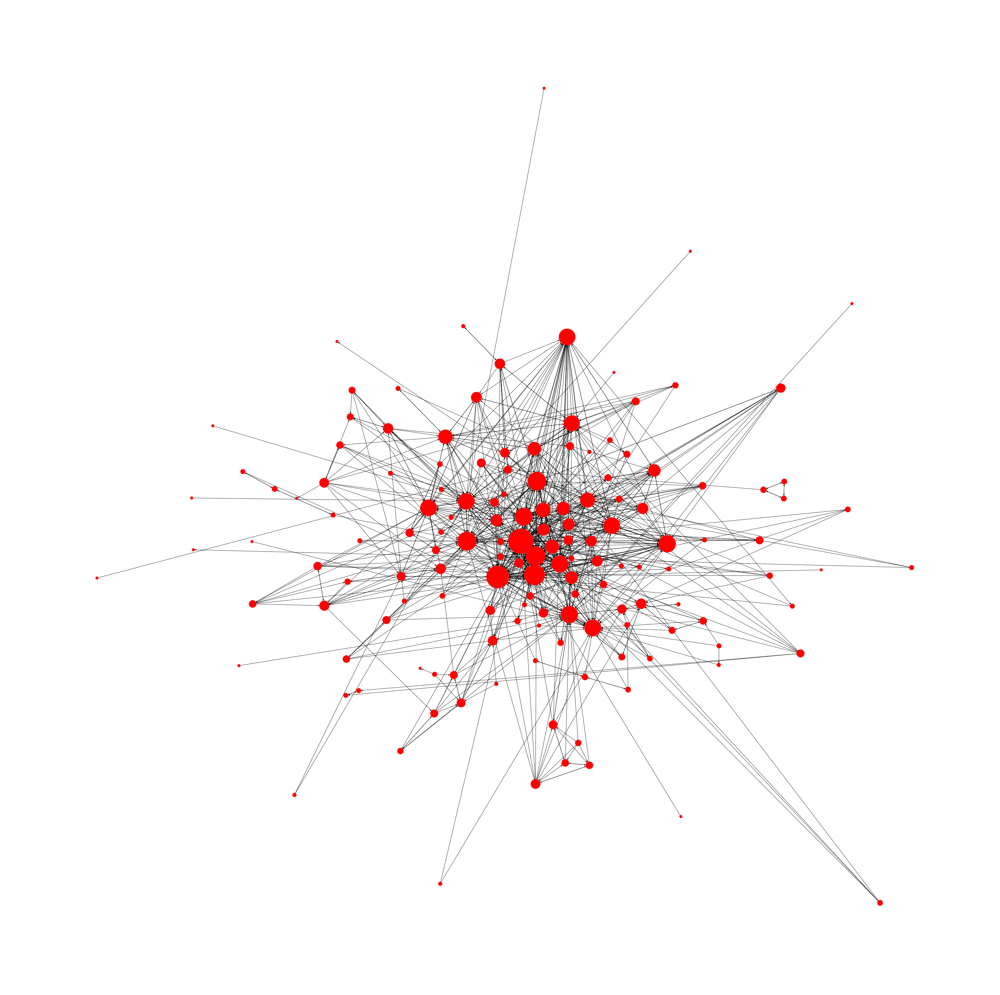

In [8]:
graphcreator(G,False)

Here below are some basic stats about the graph.

In [9]:
print(nx.info(G))

Name: 
Type: DiGraph
Number of nodes: 153
Number of edges: 843
Average in degree:   5.5098
Average out degree:   5.5098


In [10]:
# Gets the average and median degrees (the average is the same for in- and out-degrees obviously)
print 'Average Degree =', np.average(dict(G.in_degree()).values())
print 'Median In-degree =', np.median(dict(G.in_degree()).values())
print 'Median Out-degree =', np.median(dict(G.out_degree()).values())
print 'Highest In-degree =', max(dict(G.in_degree()).values())
print 'Highest Out-degree =', max(dict(G.out_degree()).values())

Average Degree = 5.509803921568627
Median In-degree = 2.0
Median Out-degree = 4.0
Highest In-degree = 54
Highest Out-degree = 29


From the statistical values above, we can see that the person with the highest in-degree (Frodo Baggins) has a much higher value than the person with the highest out-degree (also Frodo Baggins). That is due to many wikipages linking his page, and his page not linking all of them back. The median out-degree is higher than in-degree, since most of the characters have few links into their page, but a lot of the characters have more outwards link. This structure can be seen in the graph, with the network dominated by a few big hubs.




> The friendship paradox is the phenomenon that most people have fewer friends than their friends have, on average.

It is interesting to see how well our network passes the friendship paradox, since it follows the power law.

In [11]:
def friendship_paradox(graph):
    friend_dox = []
    #Do this 1000 times. How many out of those 1000 times is the friendship paradox true?

    for i in range(1000):
    #For picking a node at random, we use numpy's random.choice
        randomN = np.random.choice(graph.nodes())
        randomN_deg = graph.degree(randomN)

    #Find i's neighbors. And calculate their average degree.
        randomN_nei = graph.neighbors(randomN)
        nei_avdeg = []
        for nei in randomN_nei:
            nei_avdeg = np.mean(graph.degree(nei))
            #print(nei_avdeg)
        #print(randomN_deg)
    #Compare the two numbers to check if it's true that ii's friends (on average) have more friends than ii.
        if nei_avdeg > randomN_deg:
            friend_dox.append(1)
        else:
            friend_dox.append(0)

    print "The friendship paradox is true for {} out of 1000 instances.".format(sum(friend_dox))

    if sum(friend_dox) > 500:
        print "The paradox holds."
    else:
        print "The paradox doesn't hold."
        
friendship_paradox(G)

The friendship paradox is true for 849 out of 1000 instances.
The paradox holds.


### 2.2.a Data importing and cleaning: The books
Through googling, we found the three volumes of the Lord of the Rings on text format. [Lord of the Rings: The Fellowship of the Ring](https://archive.org/stream/TheLordOfTheRing1TheFellowshipOfTheRing/The+Lord+Of+The+Ring+1-The+Fellowship+Of+The+Ring_djvu.txt). However, with the books being a bit messy and unmaneuverable, we had to clean  and order them into a list of chapters, making it much easier to manipulate with code. The first step was to read the books in.

In [12]:
#Read in all the volumes. Remove all occurencese of \n (newline).
with open('./LOTR1_book_CLEAN.txt', 'r') as myfile:
    LOTR1_book=myfile.read()
with open('./LOTR2_book_CLEAN.txt', 'r') as myfile:
    LOTR2_book=myfile.read()
with open('./LOTR3_book_CLEAN.txt', 'r') as myfile:
    LOTR3_book=myfile.read()

    

After reading the books in, we utilized some keywords to split the three volumes into their receptive chapters. Each of the volumes is split into two books, with the word BOOK appearing capetalized in the textfile. On top of that, the keyword Chapter was used to split the books into chapters.

In [13]:

#The three volume's each consist of two Books, which we need to split by to be able to split by chapter.
#Moreover, volumes two and three include some junk at the front which we throw out.
LOTR1_book = LOTR1_book.split('BOOK')
LOTR2_book = LOTR2_book.split('BOOK')
LOTR2_book.pop(0)
LOTR3_book = LOTR3_book.split('BOOK')
LOTR3_book.pop(0)

#Now we can split each book by chapters.
LOTR1_prologue_chapters = LOTR1_book[0].split('Chapter')
LOTR1_book1_chapters = LOTR1_book[1].split('Chapter')
LOTR1_book2_chapters = LOTR1_book[2].split('Chapter')
LOTR2_book1_chapters = LOTR2_book[0].split('Chapter') #Rétt
LOTR2_book2_chapters = LOTR2_book[1].split('Chapter') #Rétt
LOTR3_book1_chapters = LOTR3_book[0].split('Chapter')
LOTR3_book2_chapters = LOTR3_book[1].split('Chapter')
#Again we need to pop out some junk at the beginning.
LOTR1_book1_chapters.pop(0)
LOTR1_book2_chapters.pop(0)
LOTR2_book1_chapters.pop(0)
LOTR2_book2_chapters.pop(0)
LOTR3_book1_chapters.pop(0)
LOTR3_book2_chapters.pop(0)
print('Data cleaning complete.')

Data cleaning complete.


Now we have a list containing all of the chapters in the three Lord of the Rings volumes, as well as the prologue. We used them to create three lists containing every chapter in each volume, as well as one list who will rule them all. 

In [14]:
#Then we add up everything to have the three volumes on a nice format.
LOTR_volume1 = LOTR1_book1_chapters+LOTR1_book2_chapters
LOTR_volume2 = LOTR2_book1_chapters+LOTR2_book2_chapters
LOTR_volume3 = LOTR3_book1_chapters+LOTR3_book2_chapters
All_chapter = LOTR1_prologue_chapters + LOTR_volume1 + LOTR_volume2 + LOTR_volume3

### 2.2.b Basic stats and network creation: The books

After cleaning the books we used the chapter splits to link together characters who appeared in the same chapters.

In [15]:
def create_list_of_character():
    df_perso = pd.read_csv("./cleaned_name.csv")
    liste_of_names = []
    for row in df_perso.iterrows():
        name = row[1].Names
        liste_of_names.append(name)
    return liste_of_names

liste_of_names2 = create_list_of_character()

In [16]:
def look_for_connection_in_book(list_of_characters, book):
    connection_chapter = []
    for chapter in book:
        people_in_chapter = []
        for character in list_of_characters:
            if character in chapter:
                people_in_chapter.append(character)
                continue
        connection_chapter.append(people_in_chapter)
    return connection_chapter


In [17]:
new_network1 = look_for_connection_in_book(liste_of_names2,LOTR_volume1)
new_network2 = look_for_connection_in_book(liste_of_names2,LOTR_volume2)
new_network3 = look_for_connection_in_book(liste_of_names2,LOTR_volume3)
new_network4 = look_for_connection_in_book(liste_of_names2,All_chapter)

Here we are connecting the characters in the chapters together, by creating edges between them and thus structuring the network.

In [18]:
def create_edges_book(list_of_names_per_chapter):
    list_of_edges = []
    for chapter in list_of_names_per_chapter:
        sub_list = []
        n = len(chapter)
        i = 0
        if n == 1:
            sub_list.append((chapter[i],chapter[i]))
        else:
            while i < n:
                j = i + 1
                while j < n:
                    sub_list.append((chapter[i],chapter[j]))
                    j += 1
                i += 1
        list_of_edges.append(sub_list)
    return list_of_edges

def cleaning_edges(list_of_edges):
    cleaned_edges = []
    dict_edges = {}
    for chapter in list_of_edges:
        for edge in chapter:
            if len(cleaned_edges) == 0:
                cleaned_edges.append(edge)
                dict_edges[edge] = 1
            elif edge in cleaned_edges:

                dict_edges[edge] += 1
            else:
                count = 0
                for element in cleaned_edges:
                    if edge[1] in element[0]:
                        if edge[0] in element[1]:
                            dict_edges[element] += 1
                            break
                        else:
                            continue
                    count += 1
                if (count == len(cleaned_edges)):
                    cleaned_edges.append(edge)
                    dict_edges[edge] = 1    
    return dict_edges
            
            

def build_network(dict_of_edges_weighted):
    G = nx.Graph()
    for edge, weight in dict_of_edges_weighted.items():
        node1 = edge[0].decode('utf-8').encode('ascii', 'replace')
        node2 = edge[1].decode('utf-8').encode('ascii', 'replace')
        G.add_edge(node1,node2, weight = weight)
    return G

def create_taille(graph):
    l = []
    for element in graph.nodes():
        l.append(graph.degree(element, weight='weight')*100)
    return l

In [19]:
edges1 = create_edges_book(new_network1)
edges2 = create_edges_book(new_network2)
edges3 = create_edges_book(new_network3)
edges_all  = create_edges_book(new_network4)

In [20]:
weighted_edges1 = cleaning_edges(edges1)
weighted_edges2 = cleaning_edges(edges2)
weighted_edges3 = cleaning_edges(edges3)
weighted_edges_all = cleaning_edges(edges_all)

Now we can create the network which forms throughout the book. Only the network for the whole book will be shown.

In [21]:
#G1 represents the network in The Fellowship of the Ring.
G1 = build_network(weighted_edges1)
#G2 represents the network in The Two Towers
G2 = build_network(weighted_edges2)
#G3 represents the network in The Return of the King.
G3 = build_network(weighted_edges3)
#G4 represents them all (including the prologue).
G4 = build_network(weighted_edges_all)

100%|██████████| 4000/4000 [00:01<00:00, 2331.44it/s]


('BarnesHut Approximation', ' took ', '0.42', ' seconds')
('Repulsion forces', ' took ', '0.93', ' seconds')
('Gravitational forces', ' took ', '0.02', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.13', ' seconds')


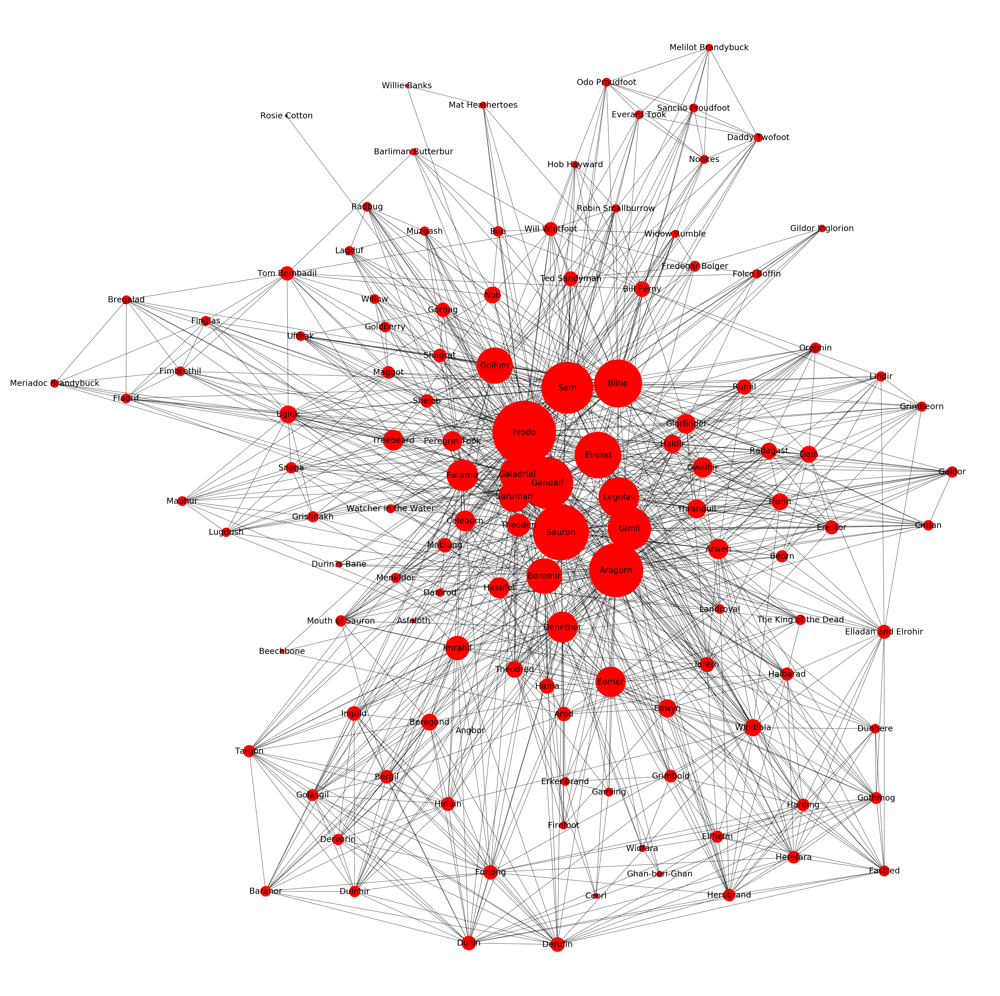

In [22]:
graphcreator(G4,True)

In [23]:
print(nx.info(G4))

Name: 
Type: Graph
Number of nodes: 125
Number of edges: 1105
Average degree:  17.6800


This graph is smaller than the other one, but has more edges and a much higher connection. That is mostly due to our chosen method of connecting characters together who appear in the same chapter.

This graph also follows the power law, however there are even more dominating characters here than in the previous graph.

In [24]:
# Gets the average and median degrees (the average is the same for in- and out-degrees obviously)
print 'Median degree =', np.median(dict(G4.degree()).values())
print 'Highest degree =', max(dict(G4.degree()).values())

Median degree = 14.0
Highest degree = 100


In [25]:
(friendship_paradox(G1))
(friendship_paradox(G2))
(friendship_paradox(G3))
(friendship_paradox(G4))

The friendship paradox is true for 704 out of 1000 instances.
The paradox holds.
The friendship paradox is true for 615 out of 1000 instances.
The paradox holds.
The friendship paradox is true for 638 out of 1000 instances.
The paradox holds.
The friendship paradox is true for 638 out of 1000 instances.
The paradox holds.


We can see that the friendship paradox has the highest support in the first book, meaning that in those chapters, there are more people who have a higher number of friends than in the graph above. This also means that the friendship paradox is closer to failing than in the network created through the wikipages.

### 2.3.a Data importing and cleaning: The movies
We accessed the transcript of the three movies (in extended edition), which contained a list of the characters and their respective lines in each movies. The datased contained three columns, the names of each character, the lines they said in each movie, and the movie that respective line was said.

In [26]:
# -*- coding: utf-8 -*-
import math 
import pandas as pd

df_script = pd.read_csv("./lotr_scripts.csv")

def split_in_three_movie(dataframe):
    list_lotr1 = []
    list_lotr2 = []
    list_lotr3 = []
    for row in dataframe.iterrows():
        movie = row[1].movie
        name_split = row[1].char.split()
        name = ""
        for element in name_split:
            if element in ['VOICE', 'VOICEOVER', 'OVER','SHOUT']:
                continue
            else:
                name += element + " "   
        name = name.rstrip()
        if "The Fellowship of the Ring" in movie:
            list_lotr1.append((name, row[1].dialog))
        elif "The Two Towers" in movie:
            list_lotr2.append((name, row[1].dialog))
        elif "The Return of the King" in movie:
            list_lotr3.append((name, row[1].dialog))
    return list_lotr1,list_lotr2,list_lotr3

def create_dict_for_dialogues(list_of_dialogues):
    unique_names = []
    for element in list_of_dialogues:
        if element[0] not in unique_names:
            unique_names.append(element[0])
    dict_of_dialogues = {}
    for name in unique_names:
        dict_of_dialogues[name] = ""
    for element in list_of_dialogues:
        if not(type(element[1]) is float):
            dict_of_dialogues[element[0]] = dict_of_dialogues[element[0]] + element[1]+ ". "
    return dict_of_dialogues

def create_files_for_characters_dialogues(folder_name, dict_name):
    for name, dialogues in dict_name.items():
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w')
        f.write(unicode(dialogues))
        f.close
    return True

def generate_dialog_file(filename, dest_directory):
    dialogue = get_dialogues_for_movie_V2(filename)
    dialogue_cleaned = clean_dialogues_list(dialogue)
    lotr_dict = create_dict_for_dialogues(dialogue_cleaned)
    create_files_for_characters_dialogues(dest_directory, lotr_dict)
    return True

Here we create a dictionary for the three movies.

In [27]:
LOTR1_list,LOTR2_list,LOTR3_list =  split_in_three_movie(df_script)

dict1 = create_dict_for_dialogues(LOTR1_list)
dict2 = create_dict_for_dialogues(LOTR2_list)
dict3 = create_dict_for_dialogues(LOTR3_list)
print('Data cleaning complete.')

Data cleaning complete.


## 3. Tools, theory and analysis


In this part, we are interested in examining the statistics of our network in order to understand it better. To measure centrality we use methods such as betweenness centrality, eigenvalue centrality and degree centralities, whcih give us a better understanding of what is connecting the nodes together.

We also want to gather an understanding of the communities present within the network. To do that we use the Python-Louvain algorithm to split the network into several partitions. That might give us a better insight of what those partitions are made of, and if they are similar to what we expect.

### 3.1.a Centrality stats: Wikipages

First we plotted up the degree distributions of the graph, since we wanted to see if it followed the power law or not.

In [30]:

def binner(graph):
    degrees = [val for (node,val) in G.degree()]
    #Degree distributions:
    degree_distribution = {"bin_edge" : [],"val_counts" : []}
    for num, val in Counter(degrees).items():
        degree_distribution["bin_edge"].append(num)
        degree_distribution["val_counts"].append(val)
    return degree_distribution

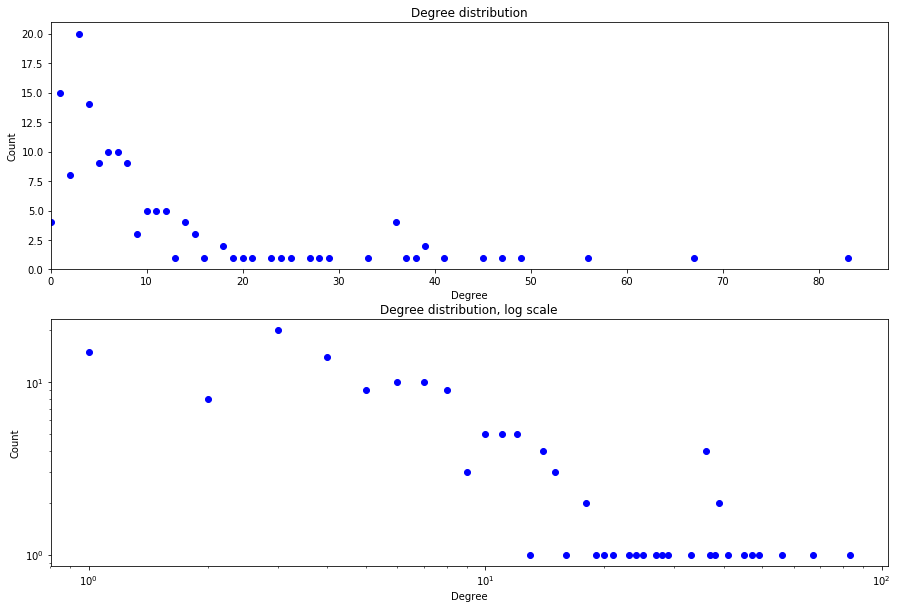

In [31]:
degree_distribution_wiki = binner(G)
# this is for the degree distribution graph.
degrees = sorted(dict(G.degree()).values())
plt.rcParams["figure.figsize"] = [15,10]
plt.title('Degree Distribution Nodes')
plt.subplot(2,1,1)
plt.title('Degree distribution')
plt.plot(degree_distribution_wiki["bin_edge"],degree_distribution_wiki["val_counts"],'bo')
plt.ylabel('Count')
plt.xlabel('Degree')
plt.xlim(xmin=0)
plt.ylim(ymin=0)

plt.subplot(2,1,2)
plt.plot(degree_distribution_wiki["bin_edge"],degree_distribution_wiki["val_counts"],'bo')
plt.ylabel('Count')
plt.title('Degree distribution, log scale')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Degree')
plt.show()


The loglog plot of the degree distribution shows that it follows the power law nicely. That means, that despite its small size, it does accurately model a hub-network.

Another check was made on the correlation between the in-degree and out-degree values of the nodes.

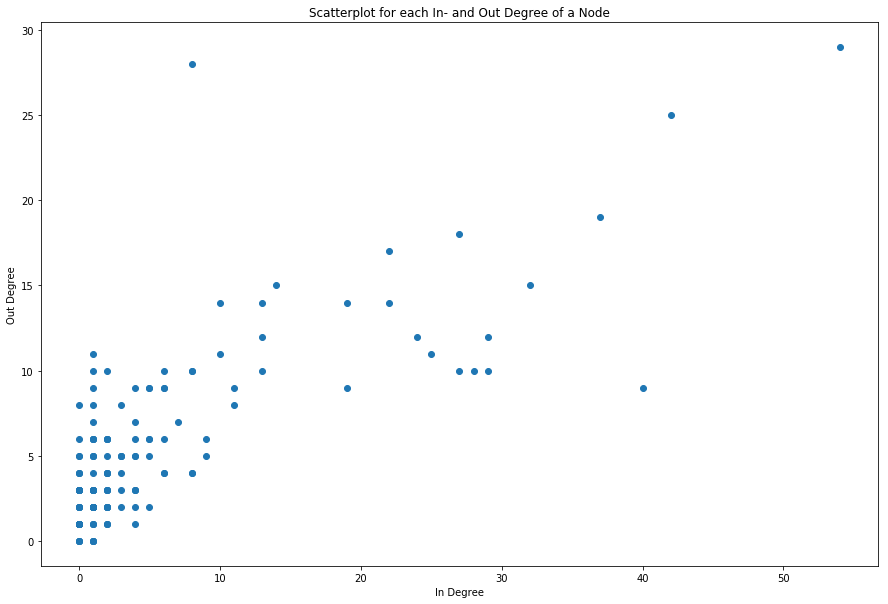

In [32]:
in_degree_characters = []
out_degree_characters = []

for n in G.nodes():
    in_degree_characters.append(G.in_degree(n))
    out_degree_characters.append(G.out_degree(n))
plt.title('Scatterplot for each In- and Out Degree of a Node')
plt.ylabel('Out Degree')
plt.xlabel('In Degree')

plt.scatter(in_degree_characters,out_degree_characters)
plt.show()

In [33]:
print 'Correlation:', np.corrcoef(out_degree_characters,in_degree_characters)[0,1]

Correlation: 0.7691694596886165


The correlation coefficient shows that characters with a high value of in-degree don't always have corresponding links back.

Here we plot up the total degree of the nodes.

In [30]:
def plotting_nodes(graph_G, string, in_out_both):
    '''
    Input:
    graph_G : passing the graph G.
    string: title of the graph.
    in_out_both : choose: in, out, both
    Output:
    output graphs with character and number of edges for each depending on in, out or both
    '''
    if in_out_both == 'in':
        c = Counter(graph_G.in_degree())
    elif in_out_both == 'out':
        c = Counter(graph_G.out_degree())
    elif in_out_both == 'both':
        c = Counter(graph_G.degree())
        
        
    mc = c.most_common(20)
    x, y = zip(*mc)
    out = pd.Series(y, x)
    plt.style.use('ggplot')
    fig, ax = plt.subplots(figsize=(15,10))
    for i, v in enumerate(y):
        ax.text(v + 0.1, i + .01, str(v), color='black', fontweight='bold')
    out.plot(kind='barh', legend = False, ax=ax)
    ax.set_xlabel('Degree')
    ax.set_title(string)
    #ax.set_ylabel('')

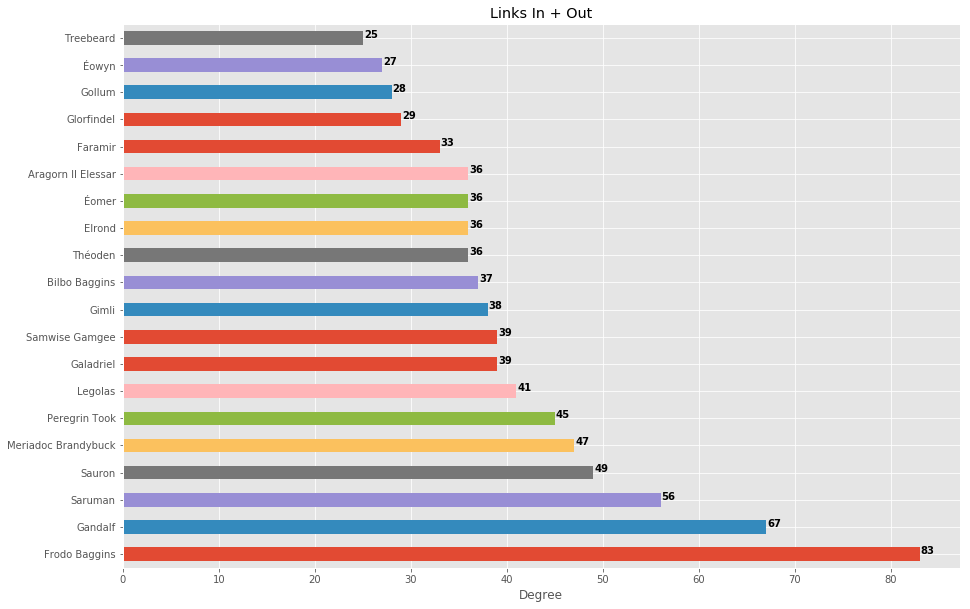

In [31]:
plotting_nodes(G, "Links In + Out", "both")

We can see that for the wikipages, Frodo has the highest number of connections.

In order to have a better understanding of the characters we need to see which nodes are the most important in the network. We can see that Frodo is the one with the highest number of edges going in and out, but we still need to calculate the centralities measured before to see if he is the most vital node. 
Next we calculate 'degree', 'eigenvector' and 'betweenness' centrality of our graph.

In [36]:
def centrality_function(graph,string):
    deg = nx.degree_centrality(graph)
    eig = nx.eigenvector_centrality(graph)
    bet = nx.betweenness_centrality(graph)
    clo = nx.closeness_centrality(graph)
    #Top 10 degree centrality but with the values for other centralities added.
    deg_df = pd.DataFrame.from_dict([deg])
    eig_df = pd.DataFrame.from_dict([eig])
    bet_df = pd.DataFrame.from_dict([bet])
    clo_df = pd.DataFrame.from_dict([clo])
    info_df = pd.DataFrame.from_dict([deg, eig, bet, clo])
    info_df = pd.DataFrame.transpose(info_df)
    info_df.columns = ['Degree', 'Eigenvector', 'Betweenness', 'Closeness']
    return info_df.sort_values(string, ascending = False)[:10]

ordered_by_degree = centrality_function(G,'Betweenness')
ordered_by_degree

,Degree,Eigenvector,Betweenness,Closeness
Frodo Baggins,0.546053,0.309650,0.121989,0.539260
Gandalf,0.440789,0.311174,0.088880,0.530632
Éowyn,0.177632,0.072613,0.083526,0.377943
Meriadoc Brandybuck,0.309211,0.146336,0.065537,0.475476
Saruman,0.368421,0.233145,0.065497,0.485926
Háma,0.046053,0.006030,0.063406,0.270730
Samwise Gamgee,0.256579,0.172468,0.059208,0.462223
Gamling,0.078947,0.000497,0.057842,0.210234
Grishnákh,0.092105,0.000042,0.050568,0.182222
Théoden,0.236842,0.134091,0.050553,0.437815


For degree centrality and betweeness centrality Frodo is the most important character, as we saw in the graph for the number of nodes since the degree centrality is basically that. It is interesting to see that Sauron is the most important node when calculating the eigenvector centrality, this means he is a central character, a hub, since he is connected to a great number of important nodes therefore making him a node of great significance. 
Now that we know wich nodes are the most important we will look at the communities for the wikipages.

### 3.1.b Community analysis: Wikipages

In [34]:
#Making the direct graph undirect.
H= G.to_undirected()
#creating Partitions of the graph
partition = community.best_partition(H)
# calculating the modularity.
mod = community.modularity(partition,H)

print("The modularity is " + str(mod))

The modularity is 0.362297839217


Is the network a big happy family where all characters know each other or are they divided into smaller groups? 

We are able to partition the graph into smaller communities and then we are able to calculate the modularity value. If the modularity value is high (close to 1) it implies a better partition, if the modularity is closer to zero then we are taking the whole network as a single community. In our case the modularity is 0.362, meaning that the network does divide into smaller groups.

In [69]:
#separitng all communities.
communities_wiki = {}
for key, value in partition.items():
    try:
        communities_wiki[value].append(key)
    except KeyError:
        communities_wiki[value] = [key]

print("The total number of communities we have for the wikipages graph is ")
print(len(communities_wiki))

In [70]:
#creating the confusion matrix for wikipages.
dd = communities_wiki
column_names = ['Com1', 'Com2', 'Com3', 'Com4', 'Com5', 'Com6', 'Com7', 'Com8', 'Com9', 'Com10', 'Com11']
#orcs or Uruk-hai together.
races_list = ['Men', 'Hobbits', 'Elves', 'Dwarves', 'Ainur', 'Orcs',  'Ents', 'Others']
B = len(races_list) #number of races.
C = len(column_names) # number of communities
confusion_matrix = np.zeros((B,C,)) 
count = 1
for com in dd:
    count+=1
    for names in range(len(dd[com])):
        name= dd[com][names]
        name = name.replace(' ', '_')
        name_index = df_names.index[df_names['Names'] == name]
        index = name_index[0]
        race = df_names['race'][index]
        if "Men" in race:
            c = confusion_matrix[0][com]
            confusion_matrix[0][com] = c + 1
        elif "Hobbit" in race:
            c = confusion_matrix[1][com]
            confusion_matrix[1][com] = c + 1 

        elif "Elves" in race:
            c= confusion_matrix[2][com]
            confusion_matrix[2][com] = c + 1

        elif "Dwarves" in race:
            c = confusion_matrix[3][com] 
            confusion_matrix[3][com] = c + 1

        elif "Ainur" in race:
            c= confusion_matrix[4][com]
            confusion_matrix[4][com] = c + 1 

        elif "Orc" in race:
            c= confusion_matrix[5][com]
            confusion_matrix[5][com] = c + 1
            
        elif "Uruk-hai"  in race:
            c = confusion_matrix[5][com]
            confusion_matrix[5][com] = c  + 1 

        elif "Ents" in race:
            c = confusion_matrix[6][com]
            confusion_matrix[6][com] = c + 1

        else: #others
            confusion_matrix[7][com] = confusion_matrix[7][com] + 1 

print(confusion_matrix.sum()) #printing the total number in the confusion matrix. (It should be 153)
confusion_matrix_wiki = pd.DataFrame(confusion_matrix, columns=column_names, index=races_list)
confusion_matrix_wiki = confusion_matrix_wiki.astype(int)

In [71]:
confusion_matrix_wiki

,Com1,Com2,Com3,Com4,Com5,Com6,Com7,Com8,Com9,Com10,Com11
Men,1,4,6,18,3,0,1,1,16,1,0
Hobbits,12,2,0,0,9,19,0,0,0,0,0
Elves,1,0,10,0,3,1,0,0,0,0,0
Dwarves,0,0,3,0,0,0,0,0,0,0,0
Ainur,0,1,3,1,0,0,0,0,0,0,0
Orcs,0,5,0,0,5,0,0,0,1,0,0
Ents,2,2,0,0,0,0,0,0,0,0,1
Others,3,2,5,0,6,1,0,0,4,0,0


We can see here how the communities are divided among the different races of middle earth. Communities 4 and 9 include mostly men. Communities 1 and 6 have mostly Hobbits, Community 3 is the Elvish one. Some communities, such as 5 and 2 seem to be more of a mix. That happens due to the battles and adventures throughout the story, forming connections appearing on the wikipages. A few characters seem to be very unconnected to other, and form a single person group.

So as a conclusion, there are large communities including mainly a single race, while other communities are mixed.

### 3.2.a Centrality stats: The books

The same process is being followed as explained earlier.

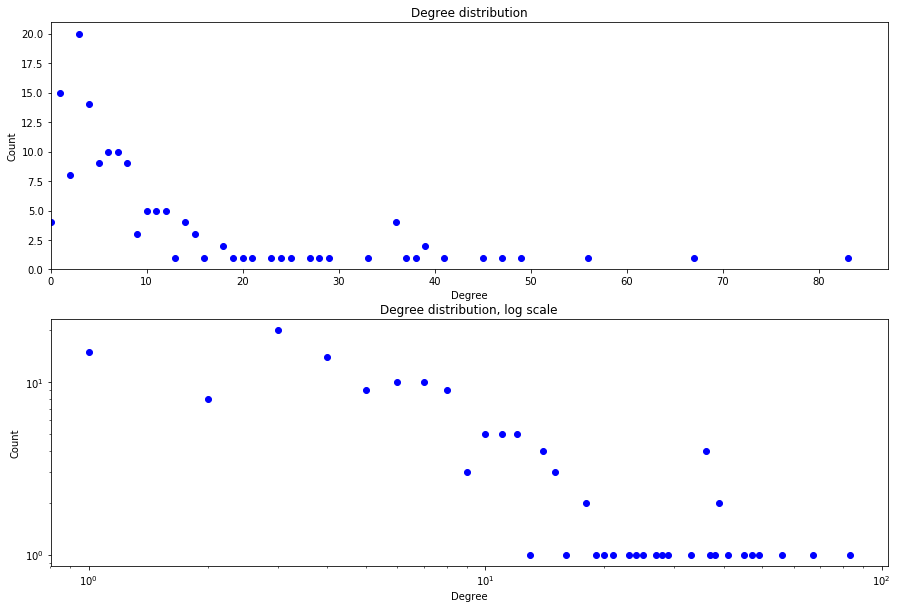

In [34]:
degree_distribution_wiki = binner(G4)
# this is for the degree distribution graph.
degrees = sorted(dict(G4.degree()).values())
plt.rcParams["figure.figsize"] = [15,10]
plt.title('Degree Distribution Nodes')
plt.subplot(2,1,1)
plt.title('Degree distribution')
plt.plot(degree_distribution_wiki["bin_edge"],degree_distribution_wiki["val_counts"],'bo')
plt.ylabel('Count')
plt.xlabel('Degree')
plt.xlim(xmin=0)
plt.ylim(ymin=0)

plt.subplot(2,1,2)
plt.plot(degree_distribution_wiki["bin_edge"],degree_distribution_wiki["val_counts"],'bo')
plt.ylabel('Count')
plt.title('Degree distribution, log scale')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Degree')
plt.show()


In [61]:
ordered_by_degree_G4 = centrality_function(G4,'Betweenness')
ordered_by_degree_G4

,Degree,Eigenvector,Betweenness,Closeness
Frodo,0.806452,0.287918,0.239157,0.832215
Aragorn,0.645161,0.245515,0.127684,0.729412
Sauron,0.580645,0.234415,0.115977,0.704545
Bilbo,0.572581,0.221139,0.078483,0.700565
Gandalf,0.524194,0.196827,0.075936,0.673913
Sam,0.443548,0.184852,0.037110,0.635897
Elrond,0.435484,0.187274,0.036970,0.635897
Eomer,0.290323,0.118220,0.028186,0.584906
Denethor,0.322581,0.151366,0.027681,0.596154
Boromir,0.354839,0.163696,0.022867,0.607843


The order by degree for the books is much more ordered. Frodo, Aragorn, Sauron, Bilbo and Gandalf appear in the first 5 places for degree-, eigenvector- and betweenness centrality, possibly due to the different nature of the network. That is not the case for the network created by using the wikipages.

The network created with the wikipages is a better representation of the background in the story, and the connection of characters is irrespective of the progression in the story, while the network created with the book focuses more on who are together or mentioned in the same chapters.

## 3.3  Text analysis

When analysing the text, various functions were created for various reasons
- TF-IDF: TF-IDF, er Term Frequency-Inverse Document Frequency in full, calculates the frequency of word occurences in a certain document, as well as how frequently it appears in other documents (chapters for us). The term frequence is simply computed by counting how frequently a certain word is compared to other words in that particular chapter, generally a very low number. The inverse document frequency is computed by dividing the number of documents with the number of documents containin that particular word. Before computing TF-IDF we had to remove stopwords and some other special characters irrelevant to our analysis, as well as making sure all words were only lowercase so that words at beginning of centences would be rated equally with other words.
- Sentiment analysis: Sentiment analysis is used calculate the sentiment in text. Various different sentimental databases exist, but we used [this one](https://journals.plos.org/plosone/article/file?type=supplementary&id=info:doi/10.1371/journal.pone.0026752.s001), used previously in this course. The average sentimental score in that database is 5.375, with a standard deviation of 1.085 and it includes a total of 10222 words. Words not included in the database were removed from texts, since the sentimental score of a text is found by computing the average of every word in that text block.
- Wordclouds: Wordclouds represent visually the term frequency of analyzed data.

In [38]:
#Functions we need for the TFIDF calculations
cachedStopWords = stopwords.words("english")

#Counts the words in a document or something. Used in get_doc.
def countWords(sent):
    count = 0
    words = word_tokenize(sent)
    for word in words:
        count += 1
    return count

#Removes unwanted characters for the TFIDF calculation.
def remove_special_characters(string):
    #start_time = time.time()
    #Removes the \n from the downloaded txt. I did it already but why not again.
    stripped = string.replace('\n', '') 
    #Removes commas, and punctiation but keeps hyphens.
    stripped = re.sub('[^\w\s{P}-]','',string)
    #Make everything lowercase. All the stopwords are in lowercase.
    stripped = stripped.lower()
    #Remove stopwords. Need to do that before removing parentheses.
    stripped = ' '.join([word for word in stripped.split() if word not in cachedStopWords])
    #Removes characters, not present in the list. Maybe I want to remove numbers?
    stripped = re.sub('[ ](?=[ ])|[^-_,A-Za-z0-9 ]+', '', stripped)
    #Remove numbers
    stripped = re.sub(r'[0-9]+', '', stripped) 
    #Removes underscores (should do that in the line before.)
    stripped = re.sub('_','',stripped)
    #All whitespace characters become a single whitespace.
    stripped = re.sub('\s+',' ',stripped)
    #Possibly I want to stem?
    stripped = stripped.strip()
    #print("Removing special characters took", time.time() - start_time, "to run")

    return stripped

def text_fixer(text):
    text_fixed = []
    for i in range(len(text)):
        if text[i] != '':
            text_fixed.append(text[i])
        
    return text_fixed

def get_doc(sent,cleantext):
    #start_time = time.time()
    doc_info = []
    i = 0
    for sent in cleantext:
        i += 1
        count = countWords(sent)
        temp = {'doc_id' : i, 'doc_length' : count}
        doc_info.append(temp)
    #print("Doc_info", time.time() - start_time, "to run")
    return doc_info

def calc_frequency(sents):
    #start_time = time.time()
    i = 0
    freqDict_list = []
    for sent in sents:
        i += 1
        freqDict = {}
        words = word_tokenize(sent)
        for word in words:
            #word = word.lower()
            if word in freqDict:
                freqDict[word] += 1
            else:
                freqDict[word] = 1
            temp = {'doc_id': i, 'freqDict' : freqDict}
        freqDict_list.append(temp)
    #print("Frequency Calculations", time.time() - start_time, "to run")
    return freqDict_list

def calculateTF(doc_info,freqDict_list):
    #start_time = time.time()
    TF_scores = []
    for tempDict in freqDict_list:
        id = tempDict['doc_id']
        for k in tempDict['freqDict']:
            temp = {'doc_id' : id,
                   'TF_scores' : float(tempDict['freqDict'][k])/float(doc_info[id-1]['doc_length']),
                   'key': k}
            TF_scores.append(temp)
    #print("Calculatin TF", time.time() - start_time, "to run")
    return TF_scores

def calculateITF(doc_info,freqDict_list):
    #start_time = time.time()
    IDF_scores = []
    counter = 0
    for dict in freqDict_list:
        counter += 1
        for k in dict['freqDict'].keys():
            count = sum([k in tempDict['freqDict'] for tempDict in freqDict_list])
            temp = {'doc_id' : counter, 
                    'IDF_scores' : math.log(len(doc_info)/count), 
                    'key' : k}
            
            IDF_scores.append(temp)
    #print("Calculating ITF", time.time() - start_time, "to run")
    return IDF_scores

def calculateTFIDF(TF_scores,IDF_scores):
    #start_time = time.time()
    TFIDF_scores = []
    for j in IDF_scores:
        for i in TF_scores:
            if j['key'] == i['key'] and j['doc_id'] == i['doc_id']:
                temp = {'doc_id' : j['doc_id'],
                       'TFIDF_scores' : j['IDF_scores']*i['TF_scores'],
                       'key' : i['key']}
        TFIDF_scores.append(temp)
    #print("TFIDF Calculatin", time.time() - start_time, "to run")
    return TFIDF_scores

#Puts all the functions above together into one super short one.
def TFIDF_generator(text):
    text_sents_clean = [remove_special_characters(s) for s in text] #Strengjaformat
    text_fixed = text_fixer(text_sents_clean)
    docinfo = get_doc(text_fixed,text_fixed)
    freqDict_list = calc_frequency(text_fixed)
    TF_scores = calculateTF(docinfo,freqDict_list)
    IDF_scores = calculateITF(docinfo,freqDict_list)
    TFIDF_scores = calculateTFIDF(TF_scores,IDF_scores)
    return TFIDF_scores



Functions used for sentimental analysis.

In [39]:
warnings.filterwarnings("ignore")

# Remove stop words and punctuation and tokenize 
#Removes unwanted characters for the TFIDF calculation.
def remove_special_characters_sent(string):
    #start_time = time.time()
    #Removes the \n from the downloaded txt. I did it already but why not again.
    stripped = string.replace('\n', '') 
    #Removes commas, and punctiation but keeps hyphens.
    stripped = re.sub('[^\w\s{P}-]','',string)
    #Make everything lowercase. All the stopwords are in lowercase.
    stripped = stripped.lower()
    #Remove stopwords. Need to do that before removing parentheses.
    #stripped = ' '.join([word for word in stripped.split() if word not in cachedStopWords])
    #Removes characters, not present in the list. Maybe I want to remove numbers?
    stripped = re.sub('[ ](?=[ ])|[^-_,A-Za-z0-9 ]+', '', stripped)
    #Removes underscores (should do that in the line before.)
    stripped = re.sub('_','',stripped)
    #All whitespace characters become a single whitespace.
    stripped = re.sub('\s+',' ',stripped)
    #Possibly I want to stem?
    stripped = stripped.strip()
    #print("Removing special characters took", time.time() - start_time, "to run")
    return stripped


# counter to count the number of lines that have been processed
counter = 0

wordrank = defaultdict(float)
path = 'file.txt'
with open(path) as f:
    for line in f:
        counter += 1
        
        # Skippin the first 4 lines.
        if counter > 4:
            line = line.split()
            word = line[0]  # get the word from the line
            wordavg = float(line[2]) # get the word happiness average
            wordrank[word] = wordavg
    
#Mitt estimate happiness
def calcSentiment(tokens,wordlist):
    
    sentiment_score = [] # an array that contains the average happyness values of the tokens
    
    for token in tokens:
        # only include the words that can be found in the data set
        if token in wordlist: 
            sentiment_score.append(wordlist[token])
            
    # If no word in the tokens array is found in the dataset then we return 0
    if len(sentiment_score) == 0:
        return None
    else : 
        return np.mean(sentiment_score)

wordlist = dict()
for i, line in enumerate(open('file.txt', 'r')):
    if i > 3:
        data = line.strip().split('\t')
        # read the word and happiness_avg into a dict.
        wordlist[data[0].lower()] = float(data[2])
        
def calcSentiment2(tokens):
    sentiment = 0.0
    for token in tokens:
        t = token.lower()
        if t in wordlist:
            sentiment += wordlist[t]
    sentiments = sentiment / len(tokens)
    return sentiments


def textTokenizer(text):
    """
    input : 
    - text which has been processed with the text cleaner.
    output :
    - tokenized text
    """
    WordsTokenized = []
    for i in range(len(text)):
        WordsTokenized.append(word_tokenize(text[i]))
    return WordsTokenized

def sentimentCalculator(chapters):
    text_sents_clean = [remove_special_characters_sent(s) for s in chapters]
    tokenizedText = textTokenizer(text_sents_clean)
    sentiment = []
    for i in range(len(tokenizedText)):
        sentiments = calcSentiment(tokenizedText[i],wordrank)
        sentiment.append(sentiments)
        
    return sentiment, tokenizedText, text_sents_clean

Functions used to create wordclouds.

In [40]:
# Creates a string consisting of all words in the TF-IDF, with each word repeated according to its frequency
def generateWordcloudString(TFIDF_scores):
    newlist = sorted(TFIDF_scores, key=lambda k: k['TFIDF_scores'],reverse=True)
    result = ""
    for word in range(len(TFIDF_scores)):
    #Skoða skölunina.
        result += (TFIDF_scores[word]['key'] + ' ')*int(round(TFIDF_scores[word]['TFIDF_scores']*250)) 
    return result

def generateWordcloudStringCharacters(TFIDF_scores):
    newlist = sorted(TFIDF_scores, key=lambda k: k['TFIDF_scores'],reverse=True)
    result = ""
    for word in range(len(TFIDF_scores)):
        result += (TFIDF_scores[word]['key'] + ' ')*int(round(TFIDF_scores[word]['TFIDF_scores'])) 
    return result


# Generates the word cloud
#Might want to enlargen the title word size.
def generateWordcloud(string, title,picture):
    got_mask = imread(picture)
    image_colors = ImageColorGenerator(got_mask)
    wordcloud = WordCloud(width=1920, height=1080, background_color="white", mode="RGBA", mask=got_mask).generate(string)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud.recolor(color_func=image_colors, random_state=3))
    plt.title(title,)
    plt.axis('off')
    plt.show()
    

### 3.3.a Text analysis: The books

First of all, the TF-IDF method was utilized, to create wordclouds for each chapter. Note that due to the incredible amount of words in each chapter, the term frequency for each word was quite low, and to generate a usable string for the wordcloud, the TF-IDF score had to be scaled. A list with the name of every chapter was created, making it easier to manouver through the wordclouds. Due to the amount of chapters and wordclouds generated, they will be shown in an appendix at the end.

### Sentiment, wordclouds e.t.c

When calculating the sentiment throughout the novels, we omitted the prologue.

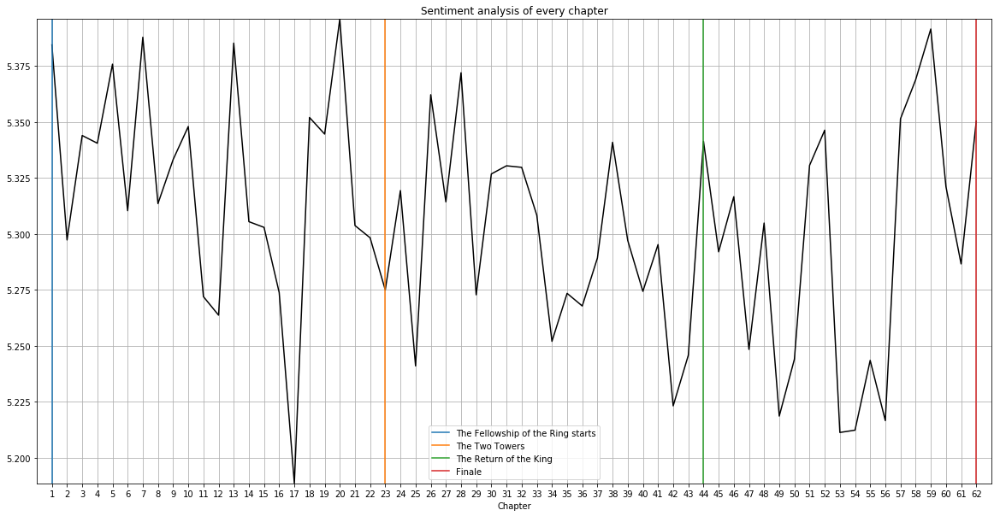

In [44]:
#sentspre, _, _ = sentimentCalculator(LOTR1_prologue_chapters)
sents11, _, _ = sentimentCalculator(LOTR1_book1_chapters)
sents12, _, _ = sentimentCalculator(LOTR1_book2_chapters)
sents21, _, _ = sentimentCalculator(LOTR2_book1_chapters)
sents22, _, _ = sentimentCalculator(LOTR2_book2_chapters)
sents31, _, _ = sentimentCalculator(LOTR3_book1_chapters)
sents32, _, _ = sentimentCalculator(LOTR3_book2_chapters)


all_sents =sents11+sents12+sents21+sents22+sents31+sents32
#plt.show()

#senti = list(reversed(sentimentscores1))
l = range(1, 63)
plt.figure(figsize=(20,10))
plt.plot(l, all_sents, '-', color='black')
plt.plot((1, 1), (min(all_sents), max(all_sents)), '-', label='The Fellowship of the Ring starts')
plt.plot((23, 23), (min(all_sents), max(all_sents)), '-', label='The Two Towers')
plt.plot((44, 44), (min(all_sents), max(all_sents)), '-', label='The Return of the King')
plt.plot((62, 62), (min(all_sents), max(all_sents)), '-', label='Finale')
plt.xticks(l)
plt.xlim(0, 63)
plt.ylim(min(all_sents), max(all_sents))
plt.grid(True)
plt.legend()
plt.xlabel('Chapter')
plt.title("Sentiment analysis of every chapter")
plt.show()

It is interesting to see that only 6 of the chapters have an average sentiment score higher than our database, meaning that in general the novels has a higher prevalence of words with a lower sentiment rating. However, note that the database we used has 10,222 words, while the number of words in the book is more than 500,000 words long, with multiple languages (Elvish and English) and a high number of words used infrequently in general in modern English.

### 3.3.b Text analysis: The movies


In this part we want to analyse what the different characters are saying in the movies and what we can learn about them through that.

In [45]:
# -*- coding: utf-8 -*-
import math 
import pandas as pd

df_script = pd.read_csv("./lotr_scripts.csv")

def split_in_three_movie(dataframe):
    list_lotr1 = []
    list_lotr2 = []
    list_lotr3 = []
    for row in dataframe.iterrows():
        movie = row[1].movie
        name_split = row[1].char.split()
        name = ""
        for element in name_split:
            if element in ['VOICE', 'VOICEOVER', 'OVER','SHOUT']:
                continue
            else:
                name += element + " "   
        name = name.rstrip()
        if "The Fellowship of the Ring" in movie:
            list_lotr1.append((name, row[1].dialog))
        elif "The Two Towers" in movie:
            list_lotr2.append((name, row[1].dialog))
        elif "The Return of the King" in movie:
            list_lotr3.append((name, row[1].dialog))
    return list_lotr1,list_lotr2,list_lotr3

def create_dict_for_dialogues(list_of_dialogues):
    unique_names = []
    for element in list_of_dialogues:
        if element[0] not in unique_names:
            unique_names.append(element[0])
    dict_of_dialogues = {}
    for name in unique_names:
        dict_of_dialogues[name] = ""
    for element in list_of_dialogues:
        if not(type(element[1]) is float):
            dict_of_dialogues[element[0]] = dict_of_dialogues[element[0]] + element[1]+ ". "
    return dict_of_dialogues

def create_files_for_characters_dialogues(folder_name, dict_name):
    for name, dialogues in dict_name.items():
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w')
        f.write(unicode(dialogues))
        f.close
    return True

def generate_dialog_file(filename, dest_directory):
    dialogue = get_dialogues_for_movie_V2(filename)
    dialogue_cleaned = clean_dialogues_list(dialogue)
    lotr_dict = create_dict_for_dialogues(dialogue_cleaned)
    create_files_for_characters_dialogues(dest_directory, lotr_dict)
    return True


Here we split the script into three seperate dictionaries.

In [46]:
LOTR1_list,LOTR2_list,LOTR3_list =  split_in_three_movie(df_script)

dict1 = create_dict_for_dialogues(LOTR1_list)
dict2 = create_dict_for_dialogues(LOTR2_list)
dict3 = create_dict_for_dialogues(LOTR3_list)

Here we form a list of the characters.

In [47]:
characters = list(df_script.char.unique())

A dictionary was created holding all the important information about each character in each movie.

In [48]:
listi1 = []
for key, value in dict1.iteritems():
    listi1.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict1[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict1[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict1[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict1[key]))),
                  "Original" : dict1[key]})


listi2 = []
for key, value in dict2.iteritems():
    listi2.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict2[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict2[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict2[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict2[key])))})

listi3 = []
for key, value in dict3.iteritems():
    listi3.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict3[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict3[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict3[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict3[key])))})

Now due to some characters not saying a word which has a sentiment score, we had to remove them from the lists. We also had problems with people who had the same names, such as Sauron and Mouth of Sauron. Due to Sauron only saying less than 10 words in the movies, and the only one with a sentimental score being 'yeah', we removed him.

In [49]:
def listcreater(listi,index1,index2):
    newlist = []
    for item in listi:
        name = item[index1] 
        value = item[index2]
        temp = [name, value]
        newlist.append(temp)
        newlist_sorted = sorted(newlist, key=lambda k: k[1],reverse=True)
    return newlist_sorted
    
LOTR1_wordsspoken = listcreater(listi1,'Name','Words spoken')
LOTR2_wordsspoken = listcreater(listi2,'Name','Words spoken')
LOTR3_wordsspoken = listcreater(listi3,'Name','Words spoken')
LOTR1_sentiment = listcreater(listi1,'Name','Sentiment value')
LOTR2_sentiment = listcreater(listi2,'Name','Sentiment value')
LOTR3_sentiment = listcreater(listi3,'Name','Sentiment value')

LOTR3_wordsspoken.pop(47)
LOTR1_sentiment.pop(32)
LOTR1_sentiment.pop(32)
LOTR3_sentiment.pop(1)
LOTR3_sentiment.pop(46)
LOTR3_wordsspoken.pop(44)

['EYE OF SAURON', 2]

We created another dictionary holding all of the values and put it into a pandas dataframe, due to how easy it is to plot nice graphs with it. 

In [50]:
#All the information gathered above we want to get into a nice pandas dictionary.
def dict_maker(Movie1,Movie2,Movie3,Movie4,Movie5,Movie6,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8):
    new_dict = {}

    for name in characters:
        temp1 = 0
        temp2 = 0
        temp3 = 0
        temp4 = 0
        temp5 = 0
        temp6 = 0
        for item in Movie1:
            if item[0] in name:
                temp1 = item[1]
                break
        for item in Movie2:
            if item[0] in name:
                temp2 = item[1]
                break
        for item in Movie3:
            if item[0] in name:
                temp3 = item[1]
                break
        for item in Movie4:
            if item[0] in name:
                temp4 = item[1]
                break
        for item in Movie5:
            if item[0] in name:
                temp5 = item[1]
                break
        for item in Movie6:
            if item[0] in name:
                temp6 = item[1]
                break
        temp7 = (temp1*temp4+temp2*temp5+temp3*temp6)/(temp1+temp2+temp3)
        new_dict[name] = {
            Col1 : temp1,
            Col2 : temp2,
            Col3 : temp3,
            Col4 : temp1+temp2+temp3,
            Col5 : temp4,
            Col6 : temp5,
            Col7 : temp6,
            Col8 : (temp7)}
        
    All_data = pd.DataFrame(new_dict).T 
    return All_data

All_data = dict_maker(LOTR1_wordsspoken,LOTR2_wordsspoken,LOTR3_wordsspoken,LOTR1_sentiment,LOTR2_sentiment,LOTR3_sentiment,'Words_LOTR1','Words_LOTR2','Words_LOTR3','Total_words','Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Avg_sent')


In [51]:
#Here we split the dataframe into two, depending on if we are plotting words or sentiments.
All_data = All_data.drop(All_data.index[71])
Many_words = All_data[All_data.Total_words >= 50]
Many_words = Many_words.sort_values('Total_words',ascending=False)
Sentiment_data = Many_words.sort_values('Avg_sent',ascending=False)
Sentiment_all = Sentiment_data[Sentiment_data.Words_LOTR1 > 1]
Sentiment_all = Sentiment_all[Sentiment_all.Words_LOTR2 > 1]
Sentiment_all = Sentiment_all[Sentiment_all.Words_LOTR3 > 1]
Sentiment_all.sort_values('Avg_sent',ascending=False)

,Avg_sent,Sent_LOTR1,Sent_LOTR2,Sent_LOTR3,Total_words,Words_LOTR1,Words_LOTR2,Words_LOTR3
MERRY,5.397923,5.396646,5.371561,5.423923,504.0,108.0,194.0,202.0
PIPPIN,5.394768,5.449333,5.394218,5.377332,621.0,107.0,185.0,329.0
ARWEN,5.381316,5.316159,5.493239,5.347921,208.0,97.0,69.0,42.0
GIMLI,5.355746,5.379799,5.332181,5.372797,545.0,123.0,250.0,172.0
ARAGORN,5.354094,5.319366,5.317481,5.414145,771.0,104.0,377.0,290.0
FRODO,5.338525,5.342888,5.362485,5.313077,867.0,223.0,312.0,332.0
SARUMAN,5.318290,5.222500,5.265024,5.410720,329.0,47.0,148.0,134.0
GALADRIEL,5.314861,5.308965,5.101250,5.477097,270.0,227.0,15.0,28.0
SAM,5.305620,5.243357,5.345826,5.273384,1112.0,109.0,540.0,463.0
ELROND,5.294400,5.265697,5.362238,5.256927,322.0,91.0,107.0,124.0


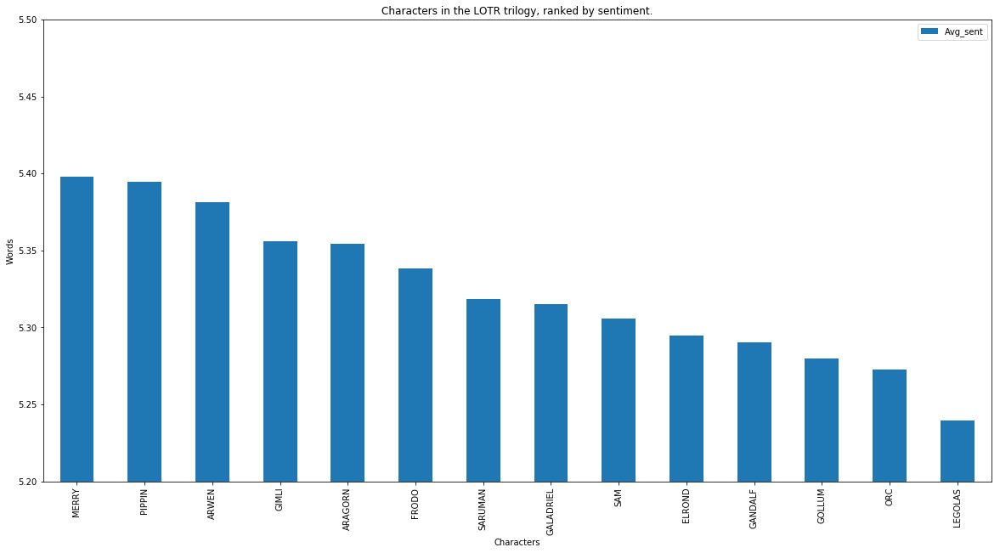

In [52]:
#Plotting the characters by how many words they say in the movie
Sentiment_all.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Words_LOTR1','Words_LOTR2', 'Words_LOTR3','Total_words'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by sentiment.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.ylim(5.2,5.5)
plt.show()

Here above we can see the sentimental scores of characters present in every single movie. Legolas gets a surprisingly low sentimental score, probably due to him being involved in so many battles and killings of orcs.

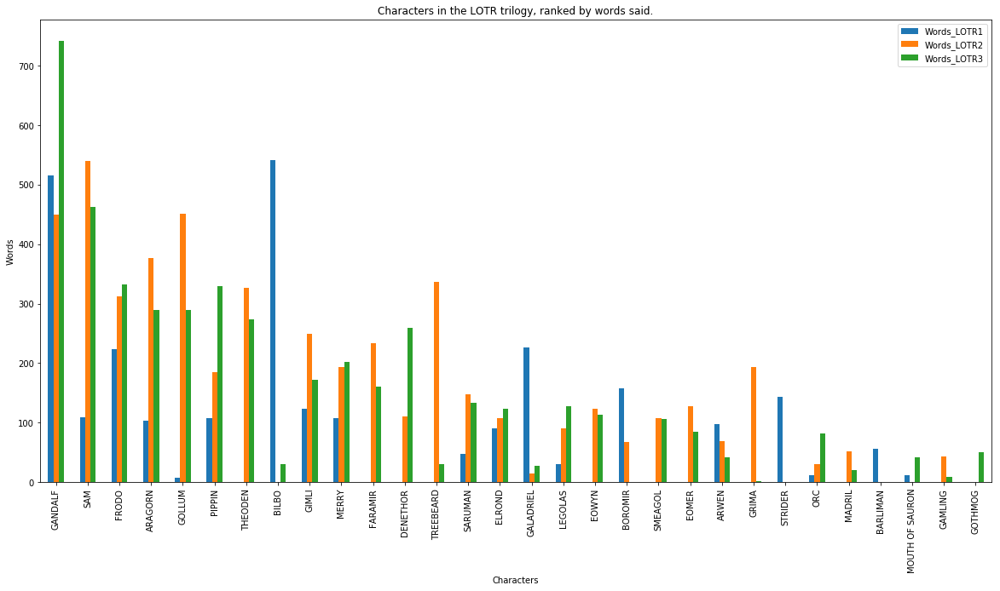

In [53]:
#Plotting the characters by how many words they say in the movie
Many_words.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Avg_sent'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by words said.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.show()

Characters of the movies plotted by how many words they say in total. Only characters who say more than 50 words are shown.

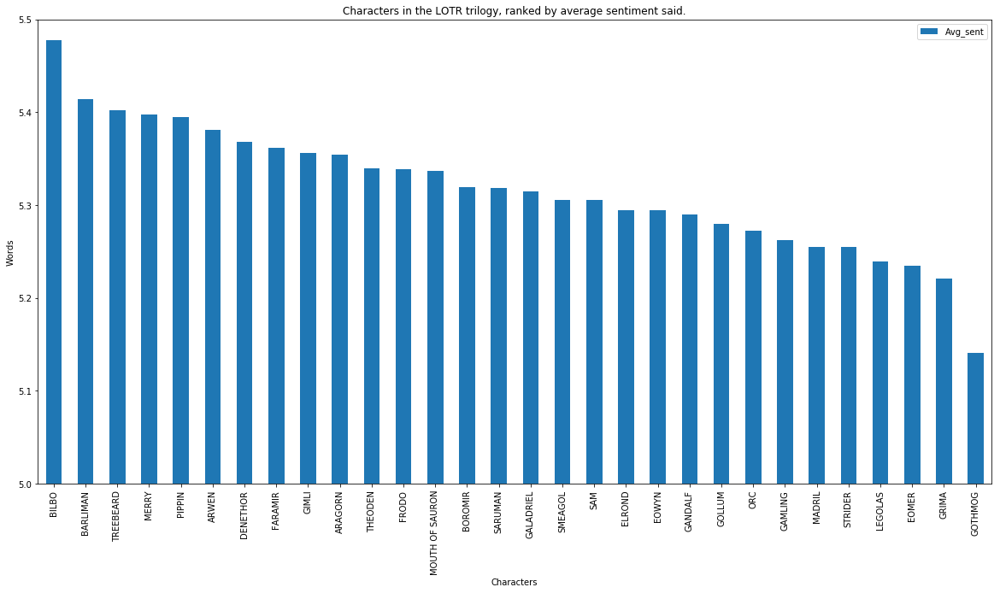

In [54]:
#Plotting a graph of the sentiment in the movies
Sentiment_data.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Words_LOTR1','Words_LOTR2', 'Words_LOTR3','Total_words'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by average sentiment said.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.ylim(5,5.5)
plt.show()

In [55]:
#Creating a dataframe for each movie
SentimentMovie1 = Sentiment_data[Sentiment_data.Words_LOTR1 >= 25]
SentimentMovie1 = SentimentMovie1.sort_values('Sent_LOTR1',ascending=False)
SentimentMovie2 = Sentiment_data[Sentiment_data.Words_LOTR2 >= 25]
SentimentMovie2 = SentimentMovie2.sort_values('Sent_LOTR2',ascending=False)
SentimentMovie3 = Sentiment_data[Sentiment_data.Words_LOTR3 >= 25]
SentimentMovie3 = SentimentMovie3.sort_values('Sent_LOTR3',ascending=False)


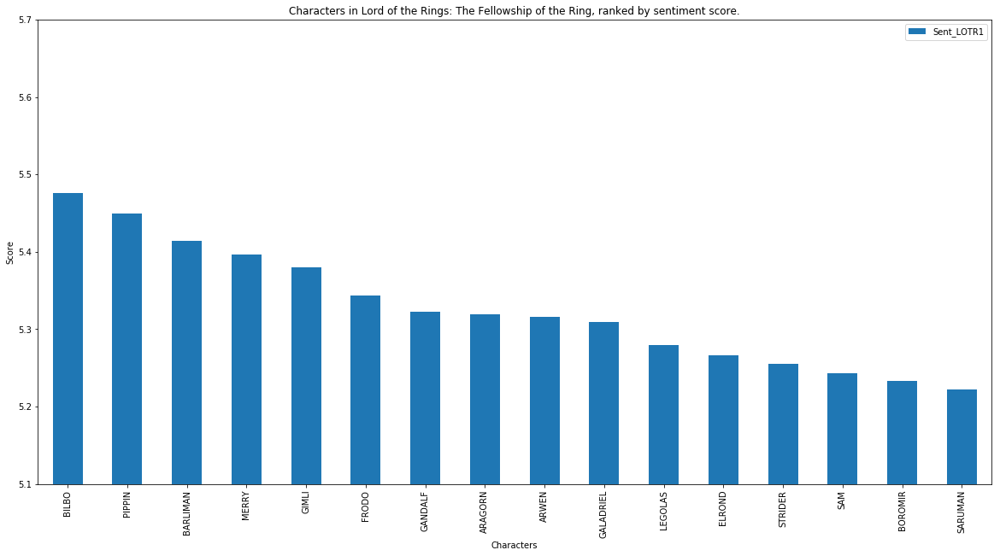

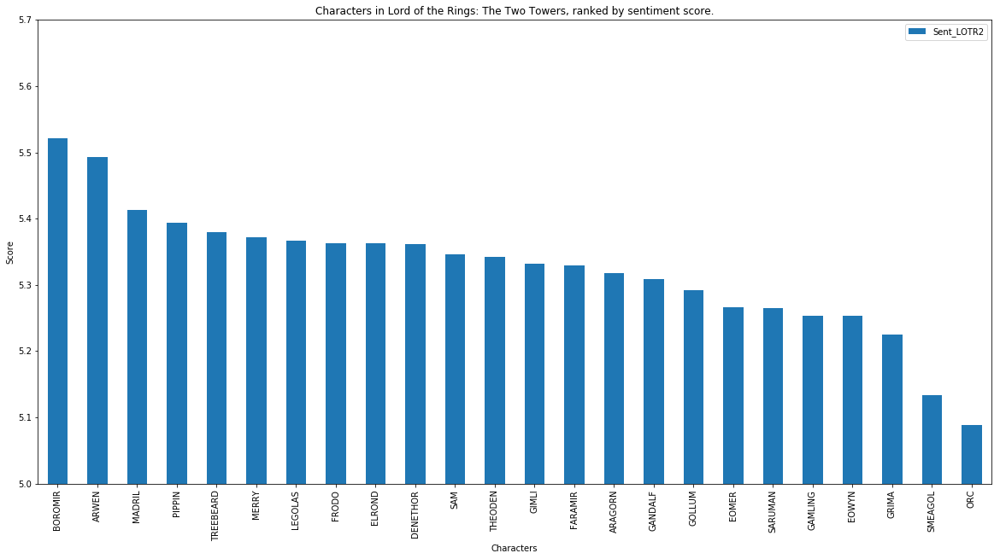

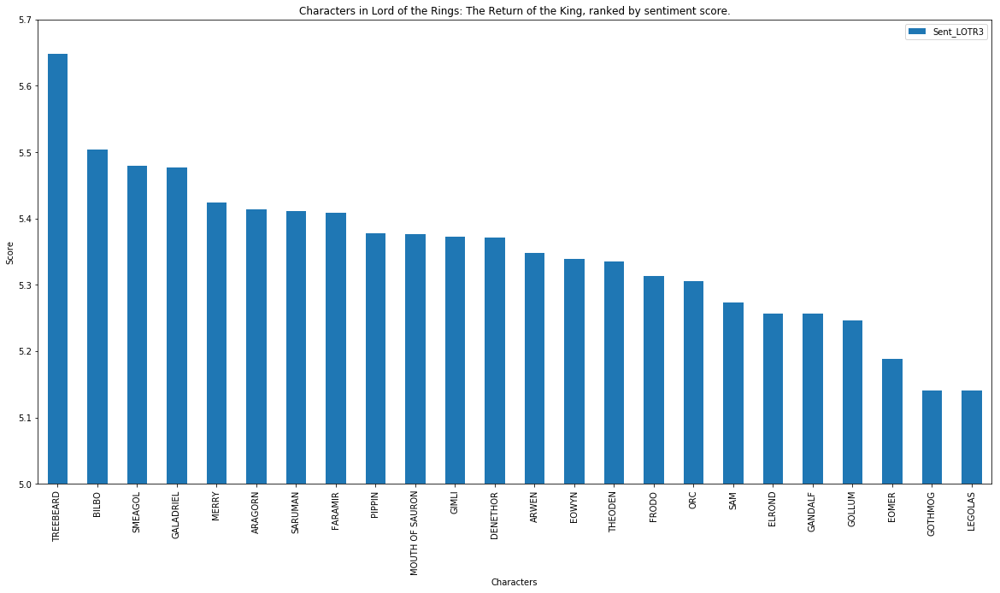

In [62]:
#Maybe make this as a function
SentimentMovie1.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR2','Sent_LOTR3'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Fellowship of the Ring, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5.1,5.7)
plt.show()


SentimentMovie2.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR1','Sent_LOTR3'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Two Towers, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5,5.7)
plt.show()

SentimentMovie3.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR1','Sent_LOTR2'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Return of the King, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5,5.7)
plt.show()


Of course, we created some wordclouds for the characters in the movie. Note that, due to most of them not saying close to as many words as are in the books, TF-IDF was deemed unnessecary. Appropriate images were selected to represent the characters.

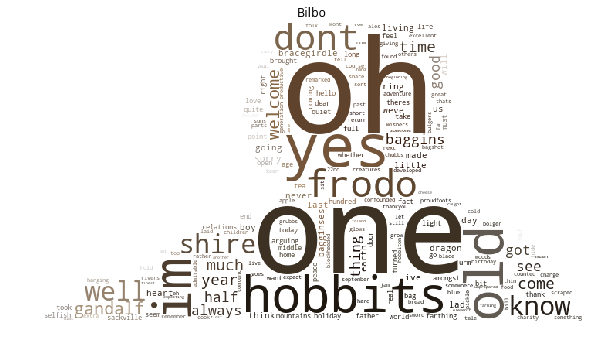

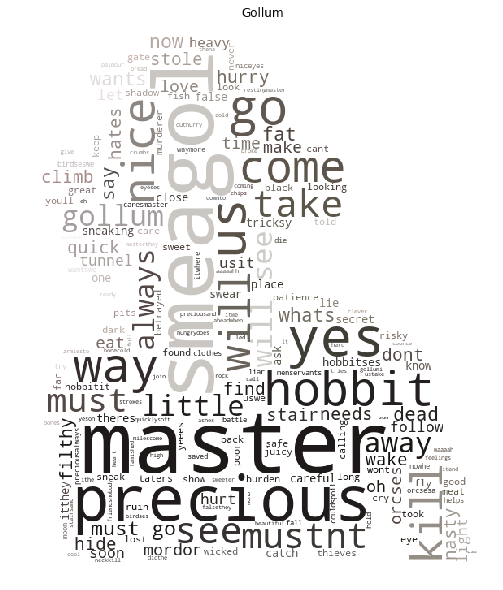

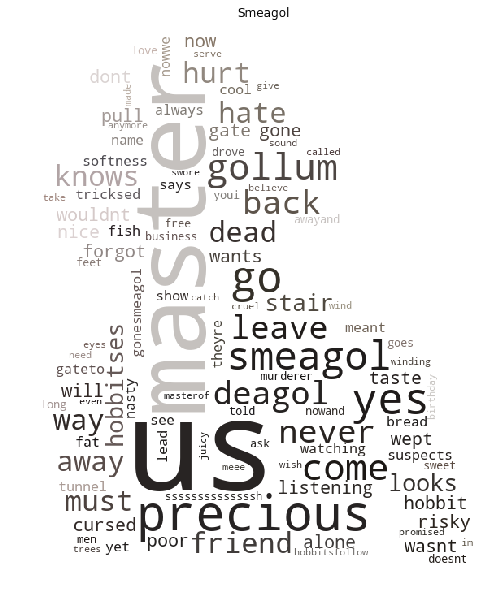

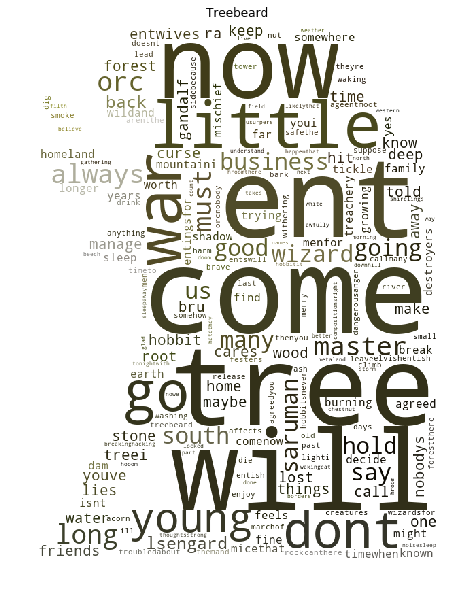

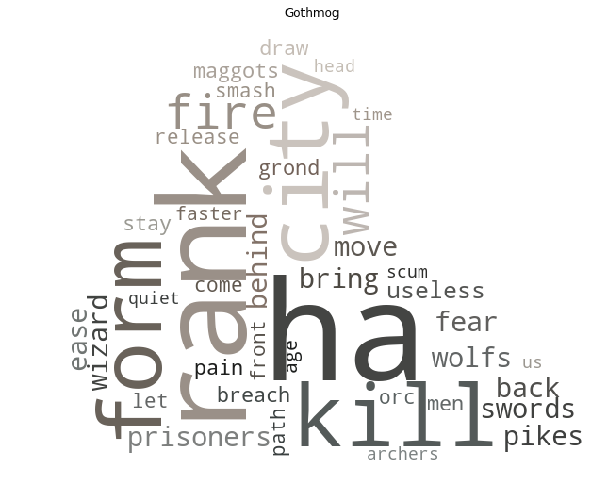

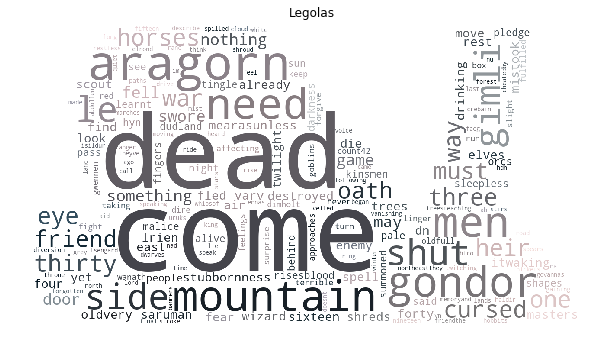

In [56]:
#Wordcloud for Bilbo
result_Bilbo = (dict1['BILBO'].replace('\xc2\xa0','')+dict3['BILBO'].replace('\xc2\xa0',''))
generateWordcloud(remove_special_characters_sent(result_Bilbo),'Bilbo',"./images/CoAgB.jpg")

#Wordcloud for Gollum
result_Gollum= dict1['GOLLUM'].replace('\xc2\xa0','')+dict2['GOLLUM'].replace('\xc2\xa0','')+dict3['GOLLUM'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Gollum),'Gollum',"./images/gollum.jpg")

#Wordcloud for Smeagol
result_Smeagol= dict2['SMEAGOL'].replace('\xc2\xa0','')+dict3['SMEAGOL'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Smeagol),'Smeagol',"./images/gollum.jpg")

#Wordcloud for Treebeard
result_Treebeard = dict2['TREEBEARD'].replace('\xc2\xa0','')+dict3['TREEBEARD'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Treebeard),'Treebeard',"./images/treebeard.jpg")

#Treebeard
result_Gothmog = dict3['GOTHMOG'].replace('\xc2\xa0','')
#TFIDF_Gothmog = TFIDF_generator(sent_tokenize(dict3['GOTHMOG'].replace('\xc2\xa0','')))
#result_Gothmog = generateWordcloudStringCharactersCharacter(TFIDF_Gothmog)
generateWordcloud(remove_special_characters_sent(result_Gothmog),'Gothmog',"./images/gothmog.png")

#Legolas
result_Legolas = dict1['LEGOLAS'].replace('\xc2\xa0','')+dict2['LEGOLAS'].replace('\xc2\xa0','')+dict3['LEGOLAS'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Legolas),'Legolas',"./images/legolas.jpg")

Last but not least, a lexical dispersion plot was made for the characters present in the movie who spoke more than 50 words. The results are quite expected, with the members of the fellowship being mentioned all throughout the books.

In [58]:
#To make sure we don't get any utf8 encoding errors!
import sys
reload(sys)
sys.setdefaultencoding('utf8')

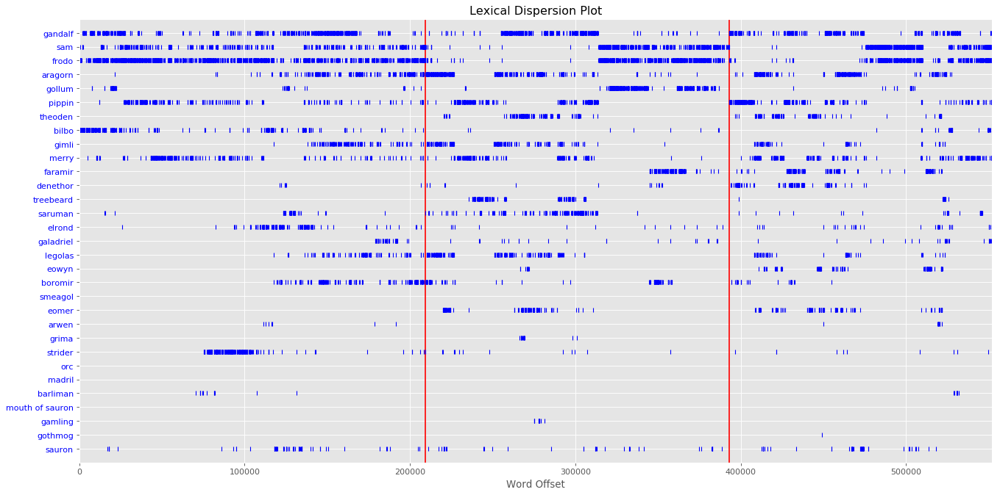

In [59]:
All_books = ["".join(LOTR1_book1_chapters+LOTR1_book2_chapters),"".join(LOTR2_book1_chapters+LOTR2_book2_chapters),"".join(LOTR3_book1_chapters+LOTR3_book2_chapters)]

nltktexts = [ nltk.Text(nltk.word_tokenize(t.lower()))  for t in All_books]
allbooks =  nltk.Text(nltk.word_tokenize(
                ' '.join([t.lower() for t in All_books])
            ))  
chars = [x.lower() for x in list(Many_words.index)]
fdist_books = nltk.FreqDist(allbooks.tokens)

#filteredcharacters = [c.lower() for c in allcharacters if fdist_books[c.lower()] > 100]



plt.figure(num=4, figsize=(20, 10), dpi=80)
plt.vlines(len(nltktexts[0]), -1, len(chars)+1, 'r')
plt.vlines(len(nltktexts[0]) + 1 + len(nltktexts[1]), -1, len(chars)+1, 'r')
plt.xlim( 0,  len(nltktexts[0]) + 1 + len(nltktexts[1]) +  len(nltktexts[2])  )
allbooks.dispersion_plot(chars+['sauron'])

This shows the appearence of every character who speaks more than 50 words in the three movies. Gandalf is the one who utters tho most words in the movies and the characters who speak the most in the movies are also generally very visible in the books. Gothmog unfortunately only gets mentioned once in the book.

## Discussion

We were happy to work on datasets from this trilogy because we could confirm our intuitions from before. It's been fun to apply everything that we've learned in this course on something we are interested in.

The results we got were very interesting. We were able to rank the characters by their importance based on different centrality measures through two different networks. The communities which were formed through the wikipages were not all expected, but it was nice to see that large communities of unremarkable people of the same race seemed to be grouped together.

The text analysis part was enthralling to work with. Even though none of us have actually read the novels, it was fun to both understand their size, and being able to anticipate what is actually happening in the chapters. The wordclouds shown below can be used pretty well to gather information about which characters are present and what is happening. The sentimental analysis gives us another window into the book, showing us when good and bad things are happening.

It was very rewarding to be able to finish with a coherent end product even though we found it difficult to clean and manipulate data. A lot of the wikipages of the minor characters seemed to be incomplete and had to be fixed manually. 


Of course this work is not perfect and can be improved. We could have benn able to find ties between communities based on race and culture. We also wanted to create a network based on the transcript of the movies, but that network would have been hard to create due to problems linking characters together. They often speak indirectly to each other in the movie, making it impossible to link seperate people accurately together. That problem was also prevalent in the graph made on the book, but the sheer size of the book made this much easier.

We are very proud of our work based on our abilities. Before we took this course, we had never attempted any data cleaning of this size. Today we have been able to finish and establish a complete work. We really enjoyed doing the work offered, and the free structure regarding the project and the whole course. 


## Appendix

In [60]:
#Búa til lista yfir kaflaheitin.
lotr_chapter = ['A Long-expected Party','The Shadow of the Past','Three is Company',
                'A Short Cut to Mushrooms','A Conspiracy Unmasked','The Old Forest',
                'In the House of Tom Bombadil','Fog on the Barrow-downs','At the Sign of the Prancing Pony',
                'Strider','A Knife in the Dark','Flight to the Ford','Many Meetings','The Council of Elrond',
                'The Ring goes South','A Journey in the Dark','The Bridge of Khazad-dum','Lothlorien',
                'The Mirror of Galadriel','Farewell to Lorien','The Great River','The Breaking of the Fellowship',
                'The Departure of Boromir','The Riders of Rohan','The Uruk-hai','Treebeard',
                'The White Rider','The King of the Golden Hall','Helm\'s Deep','The Road to Isengard',
                'Flotsam and Jetsam','The Voice of Saruman','The Palantir','The Taming of Smeagol',
                'The Passage of the Marshes','The Black Gate is Closed','Of Herbs and Stewed Rabbit',
                'The Window on the West','The Forbidden Pool','Journey to the Cross-roads',
                'The Stairs of Cirith Ungol','Shelob\'s Lair','The Choices of Master Samwise',
                'Minas Tirith','The Passing of the Grey Company','The Muster of Rohan','The Siege of Gondor',
                'The Ride of the Rohirrim','The Battle of the Pelennor Fields','The Pyre of Denethor',
                'The Houses of Healing','The Last Debate','The Black Gate Opens','The Tower of Cirith Ungol',
                'The Land of Shadow','Mount Doom','The Field of Cormallen','The Steward and the King',
                'Many Partings','Homeward Bound','The Scouring of the Shire','The Grey Havens']

In [ ]:
TFIDF_Everychapter = TFIDF_generator(All_chapter)
print("TF-IDF calculations completed.")

dol = collections.defaultdict(list)
for d in TFIDF_Everychapter:
   k = d["doc_id"]
   dol[k].append(d)

Here the wordclouds for every chapter can be seen. They are titled with the name of the chapter, and which volume of the trilogy they are included in.

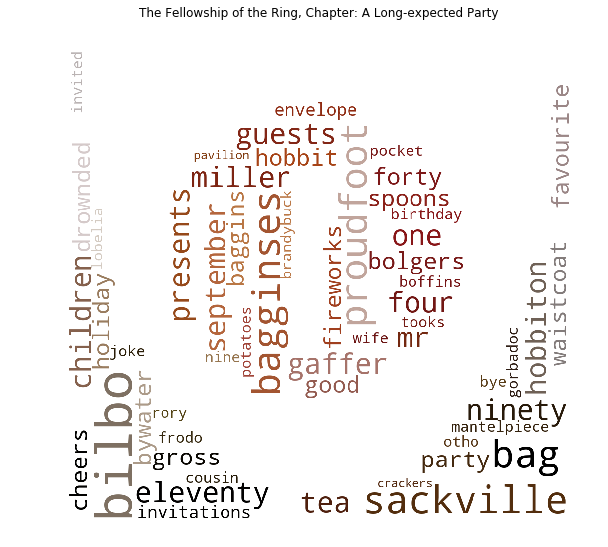

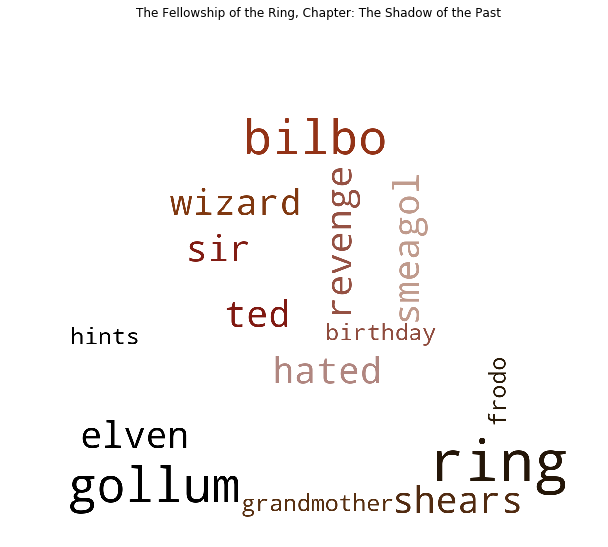

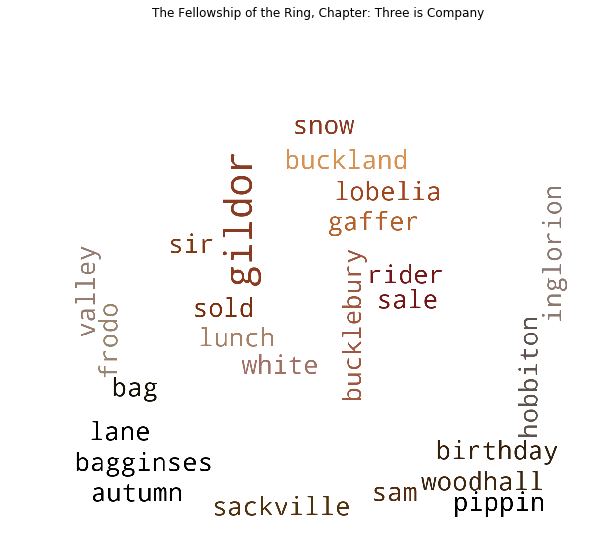

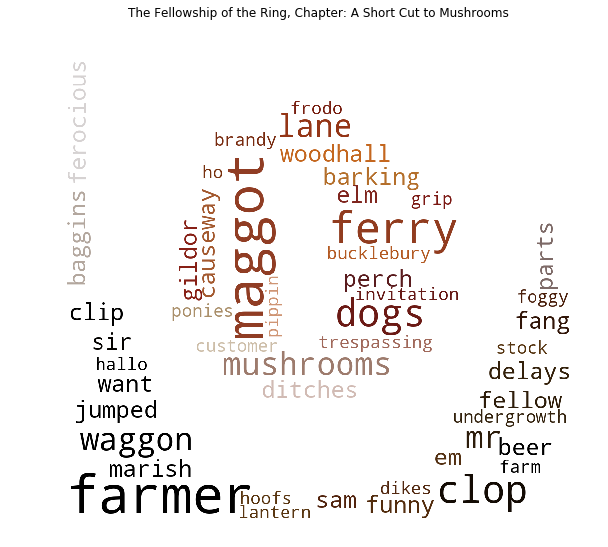

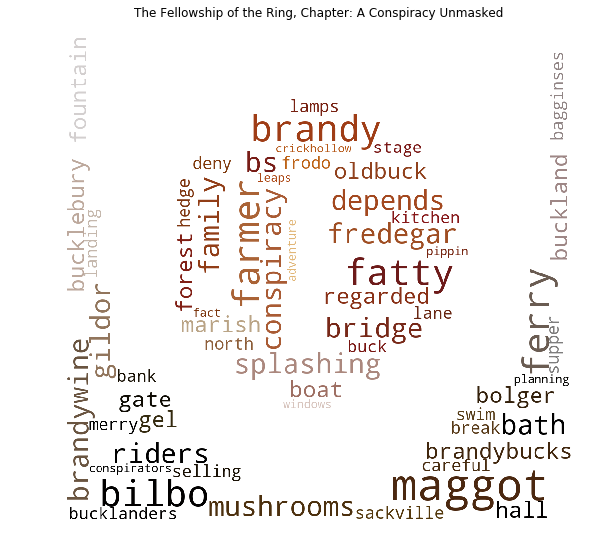

...

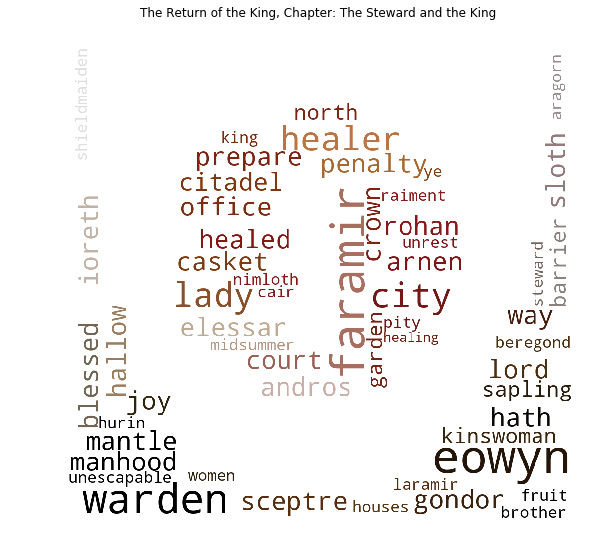

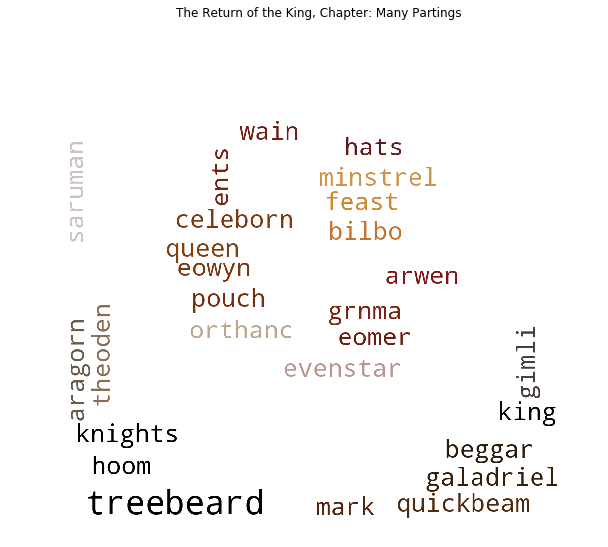

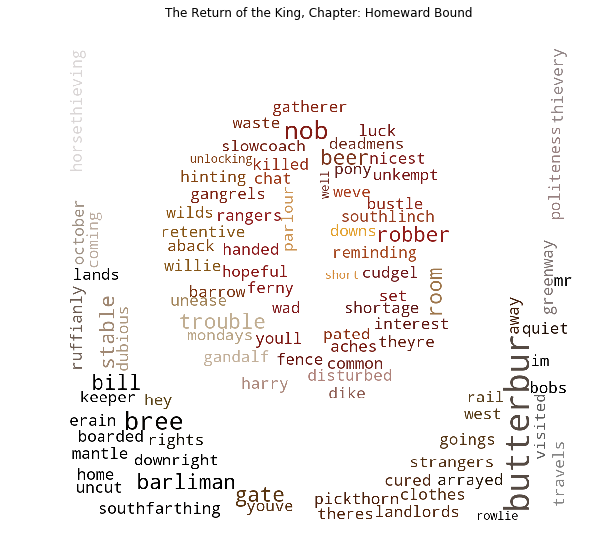

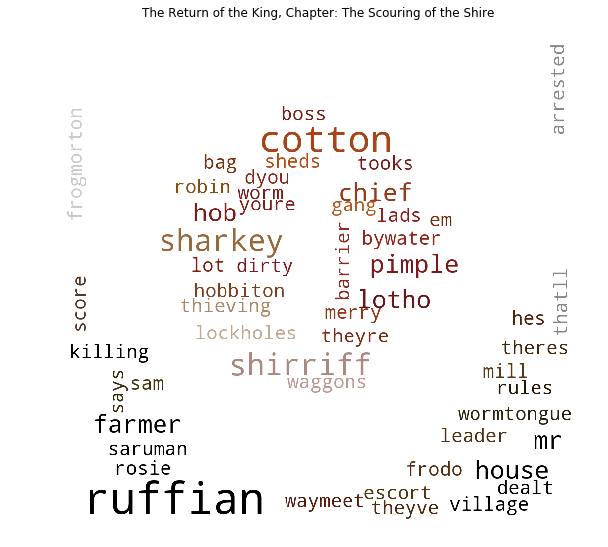

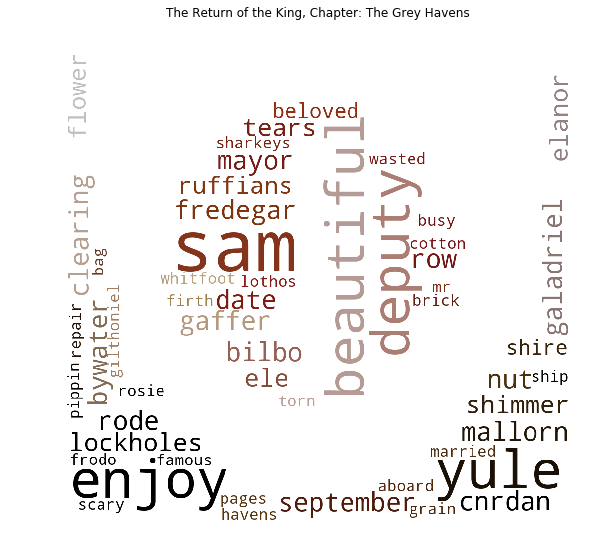

In [67]:
for i in range(6,28):
    #Generates the wordcloud
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Fellowship of the Ring, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')
for i in range(28,49):
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Two Towers, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')
for i in range(49,68):
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Return of the King, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')